In [317]:
## Michael Janke Final Project
## DSC 478

In [318]:
## Load Libraries
import numpy as np
import pandas as pd

#Set Formatting for Display
np.set_printoptions(precision=2, linewidth=500, suppress=True, threshold=np.nan)

from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None

import matplotlib.pyplot as plt
%matplotlib inline
import os


In [319]:
## Read in file
## Set low_memory=False to deal with mix datatype errors
# crashdata = pd.read_csv("all-crashes2004-2017.csv", index_col=0, low_memory=False)

# assign an index (used for PCA later)
crashdata = pd.read_csv("all-crashes2004-2017.csv", low_memory=False)

# move CRASH_CRN to its own data frame fo use later, if needed.
crashCrn = crashdata['CRASH_CRN']
crashdata.drop(['CRASH_CRN'], axis=1, inplace=True)

crashdata.shape

(170358, 189)

In [320]:
crashdata.head()

,DISTRICT,CRASH_COUNTY,MUNICIPALITY,POLICE_AGCY,CRASH_YEAR,CRASH_MONTH,DAY_OF_WEEK,TIME_OF_DAY,HOUR_OF_DAY,ILLUMINATION,WEATHER,ROAD_CONDITION,COLLISION_TYPE,RELATION_TO_ROAD,INTERSECT_TYPE,TCD_TYPE,URBAN_RURAL,LOCATION_TYPE,SCH_BUS_IND,SCH_ZONE_IND,TOTAL_UNITS,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,FATAL_COUNT,INJURY_COUNT,MAJ_INJ_COUNT,MOD_INJ_COUNT,MIN_INJ_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,UNBELTED_OCC_COUNT,UNB_DEATH_COUNT,UNB_MAJ_INJ_COUNT,BELTED_DEATH_COUNT,BELTED_MAJ_INJ_COUNT,MCYCLE_DEATH_COUNT,MCYCLE_MAJ_INJ_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_MAJ_INJ_COUNT,PED_COUNT,PED_DEATH_COUNT,PED_MAJ_INJ_COUNT,COMM_VEH_COUNT,MAX_SEVERITY_LEVEL,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,LATITUDE,LONGITUDE,DEC_LAT,DEC_LONG,EST_HRS_CLOSED,LANE_CLOSED,LN_CLOSE_DIR,NTFY_HIWY_MAINT,RDWY_SURF_TYPE_CD,SPEC_JURIS_CD,TCD_FUNC_CD,TFC_DETOUR_IND,WORK_ZONE_IND,WORK_ZONE_TYPE,WORK_ZONE_LOC,CONS_ZONE_SPD_LIM,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,FLAG_CRN,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,PROPERTY_DAMAGE_ONLY,FATAL_OR_MAJ_INJ,INJURY,FATAL,NON_INTERSECTION,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,LIMIT_65MPH,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,VEHICLE_TOWED,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,INJURY_OR_FATAL,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,MINOR_INJURY,MODERATE_INJURY,MAJOR_INJURY,NHTSA_AGG_DRIVING,PSP_REPORTED,RUNNING_STOP_SIGN,TRAIN,TROLLEY,ROADWAY_CRN,RDWY_SEQ_NUM,ADJ_RDWY_SEQ,ACCESS_CTRL,ROADWAY_COUNTY,LANE_COUNT,RDWY_ORIENT,ROAD_OWNER,ROUTE,SPEED_LIMIT,SEGMENT,OFFSET,STREET_NAME,TOT_INJ_COUNT,SCHOOL_BUS_UNIT
0,11,2,2454,2454,2004,1,5,257.0,2.0,2,1.0,0,7,2,0,0,3,0,N,N,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,40.3234,-79.9404,NaN,0,NaN,N,NaN,NaN,0.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004000001,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,2.004000e+09,3.0,3.0,3.0,2,2.0,E,2.0,2032,35.0,10.0,1000.0,LEWIS RUN RD,NaN,NaN
1,11,2,2440,2440,2004,1,5,1027.0,10.0,1,1.0,6,7,5,0,0,3,0,N,N,1,1,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,1,0,0,40 19:05.530,79 54:27.197,40.3182,-79.9076,2.0,2,6.0,N,NaN,NaN,0.0,Y,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004000010,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2.004000e+09,3.0,3.0,NaN,2,2.0,W,3.0,NaN,35.0,NaN,NaN,COAL VALLEY RD,NaN,NaN
2,11,2,2203,2203,2004,1,5,1839.0,18.0,2,1.0,0,7,5,3,3,3,0,N,N,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,0,0,40 29:18.923,80 20:13.631,40.4886,-80.3371,NaN,0,NaN,Y,NaN,NaN,3.0,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004000016,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [321]:
crashCrn.head()

0    2004000001
1    2004000010
2    2004000016
3    2004000022
4    2004000030
Name: CRASH_CRN, dtype: int64

In [322]:
# We are interested in analysing factors that lead to servere accidents
# A MAX_SEVERITY_LEVEL of 8 and 9 represents incidents with unknown severity
# Therefore, remove records with unknown serverity, 31,139 rows

crashdata = crashdata[(crashdata.MAX_SEVERITY_LEVEL != 8) & (crashdata.MAX_SEVERITY_LEVEL != 9)]
crashdata.shape

(139219, 189)

In [323]:
# remove unneeded columns from data frame
# the values are either singular or likely have no
# impact on the target variable

crashdata.drop(['DISTRICT', 'CRASH_COUNTY', 'POLICE_AGCY', 'TIME_OF_DAY', 'SCH_BUS_IND', 'SCH_ZONE_IND','TOTAL_UNITS',
                 'FATAL_COUNT', 'INJURY_COUNT', 'MAJ_INJ_COUNT', 'MOD_INJ_COUNT', 'MIN_INJ_COUNT',
                 'UNK_INJ_DEG_COUNT', 'UNK_INJ_PER_COUNT', 'UNB_DEATH_COUNT', 'UNB_MAJ_INJ_COUNT',
                 'BELTED_DEATH_COUNT', 'BELTED_MAJ_INJ_COUNT', 'MCYCLE_DEATH_COUNT', 'MCYCLE_MAJ_INJ_COUNT',
                 'BICYCLE_DEATH_COUNT', 'BICYCLE_MAJ_INJ_COUNT', 'PED_DEATH_COUNT', 'PED_MAJ_INJ_COUNT',
                 'MAX_SEVERITY_LEVEL', 'LATITUDE', 'LONGITUDE', 'DEC_LAT', 'DEC_LONG', 'EST_HRS_CLOSED',
                 'LANE_CLOSED', 'LN_CLOSE_DIR', 'NTFY_HIWY_MAINT', 'WZ_CLOSE_DETOUR', 'WZ_FLAGGER', 'WZ_LAW_OFFCR_IND',
                 'WZ_LN_CLOSURE', 'WZ_MOVING', 'WZ_OTHER', 'WZ_SHLDER_MDN', 'FLAG_CRN', 'PROPERTY_DAMAGE_ONLY',
                 'INJURY', 'FATAL', 'NON_INTERSECTION','VEHICLE_TOWED', 'INJURY_OR_FATAL', 'DRIVER_COUNT_16YR',
                 'DRIVER_COUNT_17YR', 'DRIVER_COUNT_18YR', 'DRIVER_COUNT_19YR', 'DRIVER_COUNT_20YR', 'DRIVER_COUNT_50_64YR', 
                 'DRIVER_COUNT_65_74YR', 'DRIVER_COUNT_75PLUS', 'MINOR_INJURY', 'MODERATE_INJURY', 'MAJOR_INJURY',
                 'PSP_REPORTED', 'ROADWAY_CRN', 'RDWY_SEQ_NUM', 'ADJ_RDWY_SEQ', 'ACCESS_CTRL', 'ROADWAY_COUNTY',
                 'RDWY_ORIENT', 'ROUTE', 'SEGMENT', 'OFFSET', 'STREET_NAME', 'TOT_INJ_COUNT', 'SCHOOL_BUS_UNIT',
                 'LIMIT_65MPH'], axis=1, inplace=True)

In [350]:
crashdata.shape

(136560, 117)

In [351]:
# Look for missing values
crashdata.isnull().any()

MUNICIPALITY            False
CRASH_YEAR              False
CRASH_MONTH             False
DAY_OF_WEEK             False
HOUR_OF_DAY             False
ILLUMINATION            False
WEATHER                 False
ROAD_CONDITION          False
COLLISION_TYPE          False
RELATION_TO_ROAD        False
INTERSECT_TYPE          False
TCD_TYPE                False
URBAN_RURAL             False
LOCATION_TYPE           False
PERSON_COUNT            False
VEHICLE_COUNT           False
AUTOMOBILE_COUNT        False
MOTORCYCLE_COUNT        False
BUS_COUNT               False
SMALL_TRUCK_COUNT       False
HEAVY_TRUCK_COUNT       False
SUV_COUNT               False
VAN_COUNT               False
BICYCLE_COUNT           False
UNBELTED_OCC_COUNT      False
PED_COUNT               False
COMM_VEH_COUNT          False
RDWY_SURF_TYPE_CD        True
SPEC_JURIS_CD            True
TCD_FUNC_CD              True
TFC_DETOUR_IND           True
WORK_ZONE_IND           False
WORK_ZONE_TYPE           True
WORK_ZONE_

In [352]:
#handle missing values

# count how many unknowns for HOUR_OF_DAY
# first replace na with 99
crashdata['HOUR_OF_DAY'].fillna(99, inplace=True)

# then count values
crashdata.groupby('HOUR_OF_DAY').size()

HOUR_OF_DAY
0.0      3722
1.0      3602
2.0      4455
3.0      2533
4.0      1706
5.0      2207
6.0      4172
7.0      6754
8.0      6698
9.0      5526
10.0     5404
11.0     6057
12.0     6789
13.0     6966
14.0     7903
15.0     9539
16.0     9961
17.0    10421
18.0     8005
19.0     5797
20.0     4801
21.0     4794
22.0     4500
23.0     4248
dtype: int64

In [353]:
# 2659 of 139,219 or about 2%. Because hour of the day may be an important factor, these records will be removed

crashdata = crashdata[crashdata.HOUR_OF_DAY != 99]
crashdata.shape

(136560, 117)

In [354]:
# count how many unknowns for WEATHER
# first replace na with 9
crashdata['WEATHER'].fillna(9, inplace=True)

# then count values
crashdata.groupby('WEATHER').size()

WEATHER
1.0    106047
2.0     17126
3.0       787
4.0     10533
5.0       305
6.0       187
7.0        78
8.0      1266
9.0       231
dtype: int64

In [355]:
# 231 of 136,560 or about .2%. Because weather may be an important factor, these records will be removed

crashdata = crashdata[crashdata.WEATHER != 9]
crashdata.shape

(136329, 117)

In [356]:
# Look again for missing values
crashdata.isnull().any()

MUNICIPALITY            False
CRASH_YEAR              False
CRASH_MONTH             False
DAY_OF_WEEK             False
HOUR_OF_DAY             False
ILLUMINATION            False
WEATHER                 False
ROAD_CONDITION          False
COLLISION_TYPE          False
RELATION_TO_ROAD        False
INTERSECT_TYPE          False
TCD_TYPE                False
URBAN_RURAL             False
LOCATION_TYPE           False
PERSON_COUNT            False
VEHICLE_COUNT           False
AUTOMOBILE_COUNT        False
MOTORCYCLE_COUNT        False
BUS_COUNT               False
SMALL_TRUCK_COUNT       False
HEAVY_TRUCK_COUNT       False
SUV_COUNT               False
VAN_COUNT               False
BICYCLE_COUNT           False
UNBELTED_OCC_COUNT      False
PED_COUNT               False
COMM_VEH_COUNT          False
RDWY_SURF_TYPE_CD        True
SPEC_JURIS_CD            True
TCD_FUNC_CD              True
TFC_DETOUR_IND           True
WORK_ZONE_IND           False
WORK_ZONE_TYPE           True
WORK_ZONE_

In [357]:
# count how many unknowns for RDWY_SURF_TYPE_CD
#first replace na with 9
crashdata['RDWY_SURF_TYPE_CD'].fillna(9, inplace=True)

#then count values
crashdata.groupby('RDWY_SURF_TYPE_CD').size()

RDWY_SURF_TYPE_CD
1.0       124
2.0       812
3.0         3
5.0         1
8.0         6
9.0    135383
dtype: int64

In [358]:
# Surface type is mostly unknown, so drop the column
crashdata.drop(['RDWY_SURF_TYPE_CD'], axis=1, inplace=True)

In [359]:
# count how many unknowns for SPEC_JURIS_CD
# first replace na with 9
crashdata['SPEC_JURIS_CD'].fillna(9, inplace=True)

#then count values
crashdata.groupby('SPEC_JURIS_CD').size()

SPEC_JURIS_CD
0.0       951
2.0         1
8.0         1
9.0    135376
dtype: int64

In [360]:
# Special Jurisdiction is mostly unknown, so drop the column
crashdata.drop(['SPEC_JURIS_CD'], axis=1, inplace=True)       

In [361]:
# count how many unknowns for SPEC_JURIS_CD
# first replace na with 9
crashdata['TCD_FUNC_CD'].fillna(9, inplace=True)

# then count values
crashdata.groupby('TCD_FUNC_CD').size()

TCD_FUNC_CD
0.0    90959
1.0      281
2.0      877
3.0    43568
4.0       59
9.0      585
dtype: int64

In [362]:
# 585 of 136,329 or about .4%. Because traffic control may be an important factor, these records will be removed

crashdata = crashdata[crashdata.TCD_FUNC_CD != 9]
crashdata.shape

(135744, 115)

In [363]:
# Look again for missing values
crashdata.isnull().any()

MUNICIPALITY            False
CRASH_YEAR              False
CRASH_MONTH             False
DAY_OF_WEEK             False
HOUR_OF_DAY             False
ILLUMINATION            False
WEATHER                 False
ROAD_CONDITION          False
COLLISION_TYPE          False
RELATION_TO_ROAD        False
INTERSECT_TYPE          False
TCD_TYPE                False
URBAN_RURAL             False
LOCATION_TYPE           False
PERSON_COUNT            False
VEHICLE_COUNT           False
AUTOMOBILE_COUNT        False
MOTORCYCLE_COUNT        False
BUS_COUNT               False
SMALL_TRUCK_COUNT       False
HEAVY_TRUCK_COUNT       False
SUV_COUNT               False
VAN_COUNT               False
BICYCLE_COUNT           False
UNBELTED_OCC_COUNT      False
PED_COUNT               False
COMM_VEH_COUNT          False
TCD_FUNC_CD             False
TFC_DETOUR_IND           True
WORK_ZONE_IND           False
WORK_ZONE_TYPE           True
WORK_ZONE_LOC            True
CONS_ZONE_SPD_LIM        True
WORKERS_PR

In [364]:
# count how many unknowns for TFC_DETOUR_IND
# first replace na with U
crashdata['TFC_DETOUR_IND'].fillna('U', inplace=True)

# then count values
crashdata.groupby('TFC_DETOUR_IND').size()

TFC_DETOUR_IND
N    41696
U    77820
Y    16228
dtype: int64

In [365]:
# There are many unknowns, I will assume N for the unknowns
crashdata['TFC_DETOUR_IND'].replace('U','N', inplace=True)

# count values to verify
crashdata.groupby('TFC_DETOUR_IND').size()

TFC_DETOUR_IND
N    119516
Y     16228
dtype: int64

In [366]:
# count how many unknowns for WORK_ZONE_TYPE
# first replace na with 0
crashdata['WORK_ZONE_TYPE'].fillna(0, inplace=True)

# then count values
crashdata.groupby('WORK_ZONE_TYPE').size()

WORK_ZONE_TYPE
0.0    133210
1.0      1988
2.0       335
3.0        70
8.0       141
dtype: int64

In [367]:
crashdata.groupby('WORK_ZONE_IND').size()

WORK_ZONE_IND
N    133208
Y      2536
dtype: int64

In [368]:
# Most of the missing work zone types can be attributed to the incident not being in a work zone
# Work Zone Type 8 is undefined in the dictionary; could mean unknown
# It is likely sufficient to identify a work zone without type, so removing column
crashdata.drop(['WORK_ZONE_TYPE'], axis=1, inplace=True)      

In [369]:
# count how many unknowns for WORK_ZONE_TYPE
# first replace na with 0
crashdata['WORK_ZONE_LOC'].fillna(0, inplace=True)

# then count values
crashdata.groupby('WORK_ZONE_LOC').size()

WORK_ZONE_LOC
0.0    133210
1.0        67
2.0       360
3.0       381
4.0      1278
5.0       113
8.0       335
dtype: int64

In [370]:
# The same is true for work zone location, workers present, and construction zone speed limit
crashdata.drop(['WORK_ZONE_LOC', 'WORKERS_PRES', 'CONS_ZONE_SPD_LIM'], axis=1, inplace=True)    

In [371]:
# Look again for missing values
crashdata.isnull().any()

MUNICIPALITY            False
CRASH_YEAR              False
CRASH_MONTH             False
DAY_OF_WEEK             False
HOUR_OF_DAY             False
ILLUMINATION            False
WEATHER                 False
ROAD_CONDITION          False
COLLISION_TYPE          False
RELATION_TO_ROAD        False
INTERSECT_TYPE          False
TCD_TYPE                False
URBAN_RURAL             False
LOCATION_TYPE           False
PERSON_COUNT            False
VEHICLE_COUNT           False
AUTOMOBILE_COUNT        False
MOTORCYCLE_COUNT        False
BUS_COUNT               False
SMALL_TRUCK_COUNT       False
HEAVY_TRUCK_COUNT       False
SUV_COUNT               False
VAN_COUNT               False
BICYCLE_COUNT           False
UNBELTED_OCC_COUNT      False
PED_COUNT               False
COMM_VEH_COUNT          False
TCD_FUNC_CD             False
TFC_DETOUR_IND          False
WORK_ZONE_IND           False
INTERSTATE              False
STATE_ROAD              False
LOCAL_ROAD              False
LOCAL_ROAD

In [372]:
# count how many unknowns for LANE_COUNT
# first replace na with 99
crashdata['LANE_COUNT'].fillna(99, inplace=True)

# then count values
crashdata.groupby('LANE_COUNT').size()

LANE_COUNT
0.0         23
1.0       6004
2.0     106009
3.0      10706
4.0       9652
5.0        735
6.0        228
7.0         26
8.0          6
9.0          8
10.0         1
11.0         1
12.0         1
21.0         1
22.0         7
24.0         1
25.0        23
32.0         1
35.0         3
45.0         1
46.0         1
50.0         1
52.0         1
62.0         7
63.0         1
64.0         1
65.0         1
94.0         1
99.0      2293
dtype: int64

In [373]:
# LANE_COUNT has some unusual values, might be best to remove this column, no definition provided
crashdata.drop(['LANE_COUNT'], axis=1, inplace=True)  

In [374]:
# count how many unknowns for ROAD_OWNER
# first replace na with 9
crashdata['ROAD_OWNER'].fillna(9, inplace=True)

# then count values
crashdata.groupby('ROAD_OWNER').size()

# Leaving 9 as is. 9 is defined as Other or Unknown

ROAD_OWNER
1.0    13419
2.0    64198
3.0     5229
4.0    49849
5.0     2036
6.0      135
7.0      763
9.0      115
dtype: int64

In [375]:
# count how many unknowns for SPEED_LIMIT
# first replace na with 0
crashdata['SPEED_LIMIT'].fillna(0, inplace=True)

# then count values
crashdata.groupby('SPEED_LIMIT').size()

SPEED_LIMIT
0.0      4843
10.0      131
15.0     1909
20.0      757
25.0    47399
30.0     3592
35.0    34634
40.0    13012
45.0     7027
50.0      914
55.0    18810
60.0        1
65.0     2713
70.0        1
75.0        1
dtype: int64

In [376]:
# 4843 of 135,744 or about 3.6%. Because speed limit may be an important factor, these records will bw removed

crashdata = crashdata[crashdata.SPEED_LIMIT != 0]
crashdata.shape

(130901, 110)

In [377]:
# Verify all missing values have been taken care of
crashdata.isnull().any().any()

False

In [378]:
## 1. Categorical Distributions

temp1 = crashdata["MUNICIPALITY"].value_counts()/crashdata["MUNICIPALITY"].count()
temp2 = crashdata["CRASH_YEAR"].value_counts()/crashdata["CRASH_YEAR"].count()
temp3 = crashdata["CRASH_MONTH"].value_counts()/crashdata["CRASH_MONTH"].count()
temp4 = crashdata["DAY_OF_WEEK"].value_counts()/crashdata["DAY_OF_WEEK"].count()
temp5 = crashdata["HOUR_OF_DAY"].value_counts()/crashdata["HOUR_OF_DAY"].count()
temp6 = crashdata["ILLUMINATION"].value_counts()/crashdata["ILLUMINATION"].count()
temp7 = crashdata["WEATHER"].value_counts()/crashdata["WEATHER"].count()
temp8 = crashdata["ROAD_CONDITION"].value_counts()/crashdata["ROAD_CONDITION"].count()
temp9 = crashdata["COLLISION_TYPE"].value_counts()/crashdata["COLLISION_TYPE"].count()
temp10 = crashdata["RELATION_TO_ROAD"].value_counts()/crashdata["RELATION_TO_ROAD"].count()
temp11 = crashdata["INTERSECT_TYPE"].value_counts()/crashdata["INTERSECT_TYPE"].count()
temp12 = crashdata["TCD_TYPE"].value_counts()/crashdata["TCD_TYPE"].count()
temp13 = crashdata["URBAN_RURAL"].value_counts()/crashdata["URBAN_RURAL"].count()
temp14 = crashdata["LOCATION_TYPE"].value_counts()/crashdata["LOCATION_TYPE"].count()
temp15 = crashdata["TCD_FUNC_CD"].value_counts()/crashdata["TCD_FUNC_CD"].count()
temp16 = crashdata["ROAD_OWNER"].value_counts()/crashdata["ROAD_OWNER"].count()
temp17 = crashdata["SPEED_LIMIT"].value_counts()/crashdata["SPEED_LIMIT"].count()

#fig = plt.figure(figsize=(500,100))

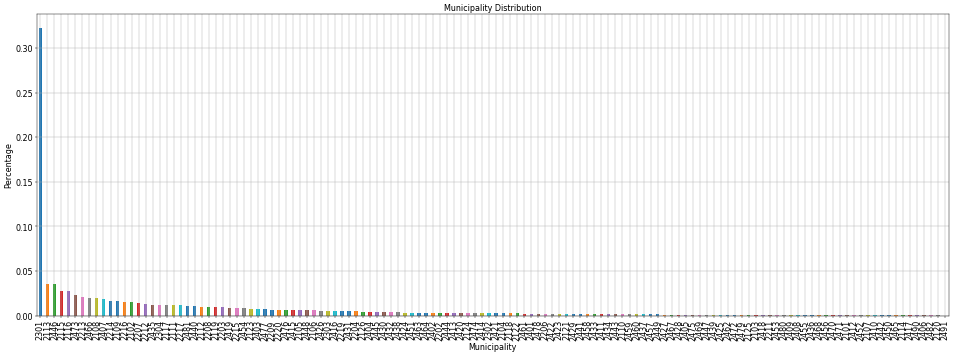

In [379]:
## Municipality distribution

fig = plt.figure(figsize=(100,10), dpi=40)

ax1 = fig.add_subplot(131)
ax1.set_xlabel('Municipality')
ax1.set_ylabel('Percentage')
ax1.set_title("Municipality Distribution")
temp1.plot(kind='bar', grid = True)

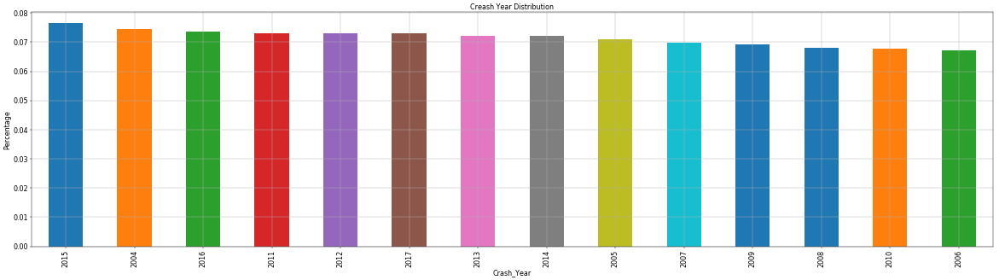

In [380]:
## Crash Year Distribution

fig = plt.figure(figsize=(80,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Crash_Year')
ax1.set_ylabel('Percentage')
ax1.set_title("Creash Year Distribution")
temp2.plot(kind='bar', grid = True)

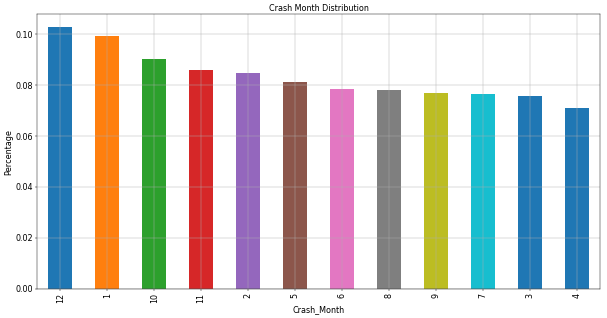

In [381]:
## Crash Month Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Crash_Month')
ax1.set_ylabel('Percentage')
ax1.set_title("Crash Month Distribution")
temp3.plot(kind='bar', grid = True)

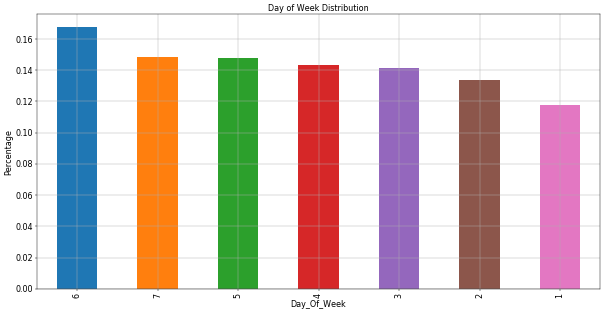

In [382]:
## Day Of Week Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Day_Of_Week')
ax1.set_ylabel('Percentage')
ax1.set_title("Day of Week Distribution")
temp4.plot(kind='bar', grid = True)

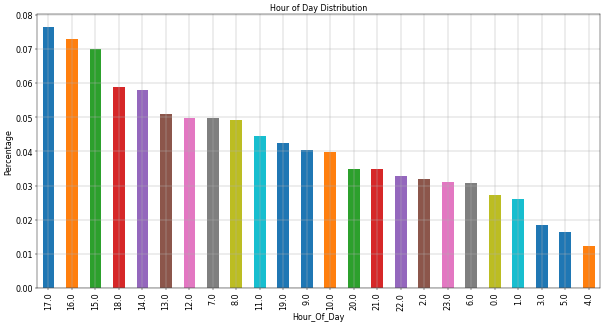

In [383]:
## Hour of Day Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Hour_Of_Day')
ax1.set_ylabel('Percentage')
ax1.set_title("Hour of Day Distribution")
temp5.plot(kind='bar', grid = True)

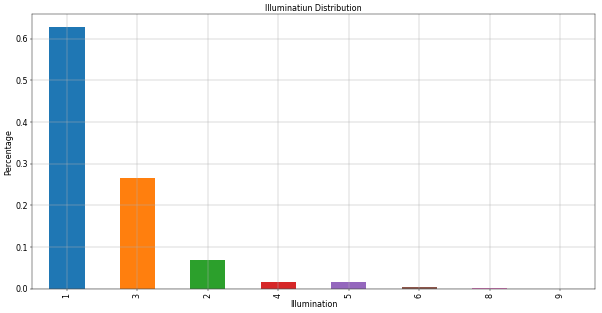

In [384]:
## Illiumination Distribution
fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Illumination')
ax1.set_ylabel('Percentage')
ax1.set_title("Illuminatiun Distribution")
temp6.plot(kind='bar', grid = True)

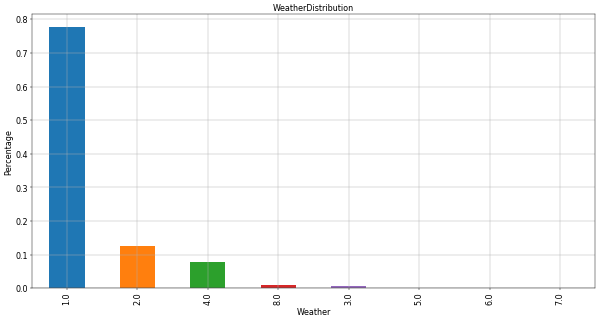

In [385]:
## Weather Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Weather')
ax1.set_ylabel('Percentage')
ax1.set_title("WeatherDistribution")
temp7.plot(kind='bar', grid = True)

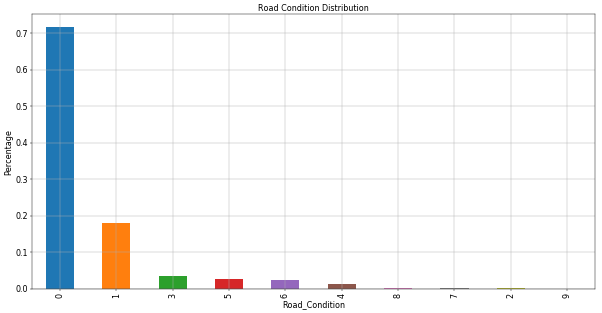

In [386]:
## Road Condition Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Road_Condition')
ax1.set_ylabel('Percentage')
ax1.set_title("Road Condition Distribution")
temp8.plot(kind='bar', grid = True)

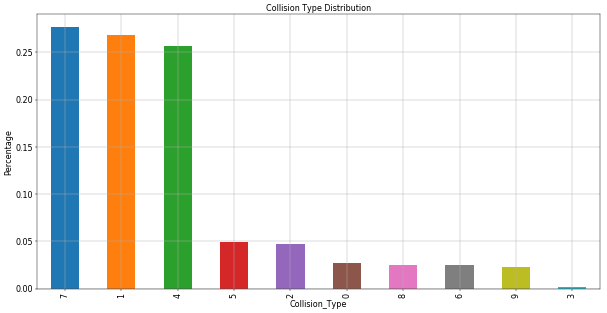

In [387]:
## Collision Type Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Collision_Type')
ax1.set_ylabel('Percentage')
ax1.set_title("Collision Type Distribution")
temp9.plot(kind='bar', grid = True)

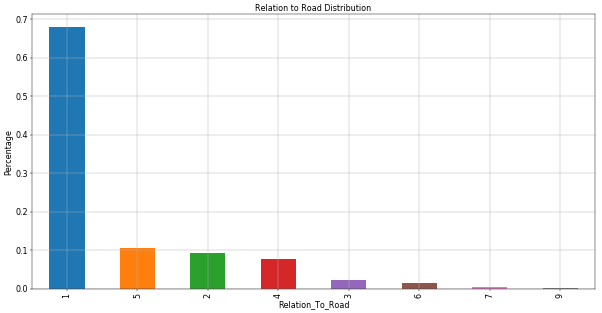

In [388]:
## Relation to Road Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Relation_To_Road')
ax1.set_ylabel('Percentage')
ax1.set_title("Relation to Road Distribution")
temp10.plot(kind='bar', grid = True)

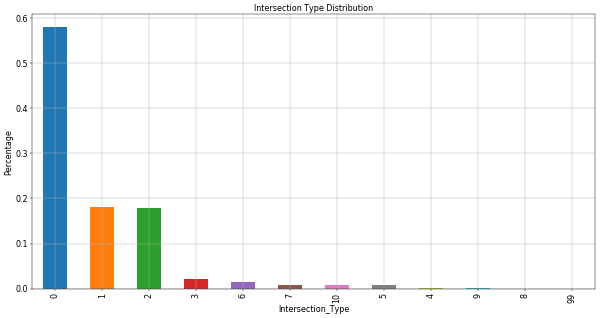

In [389]:
## Intersection Type Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Intersection_Type')
ax1.set_ylabel('Percentage')
ax1.set_title("Intersection Type Distribution")
temp11.plot(kind='bar', grid = True)

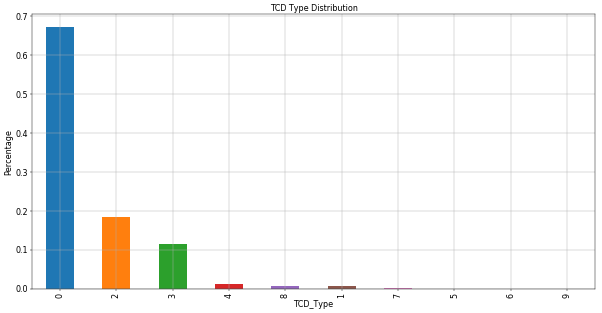

In [390]:
## TCD Type Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('TCD_Type')
ax1.set_ylabel('Percentage')
ax1.set_title("TCD Type Distribution")
temp12.plot(kind='bar', grid = True)

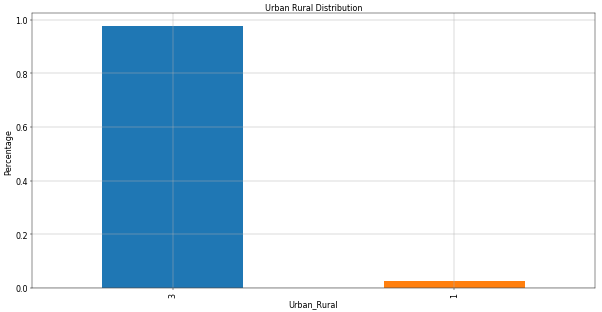

In [391]:
## Urban Rural Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Urban_Rural')
ax1.set_ylabel('Percentage')
ax1.set_title("Urban Rural Distribution")
temp13.plot(kind='bar', grid = True)

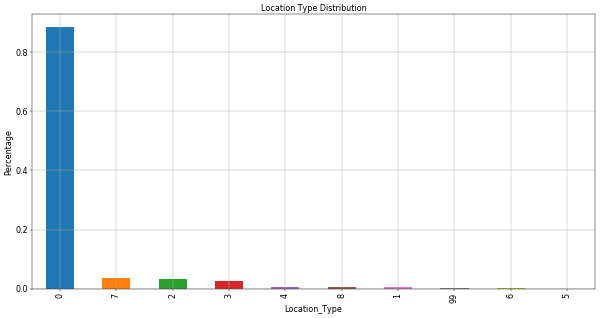

In [392]:
## Location Type Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Location_Type')
ax1.set_ylabel('Percentage')
ax1.set_title("Location Type Distribution")
temp14.plot(kind='bar', grid = True)

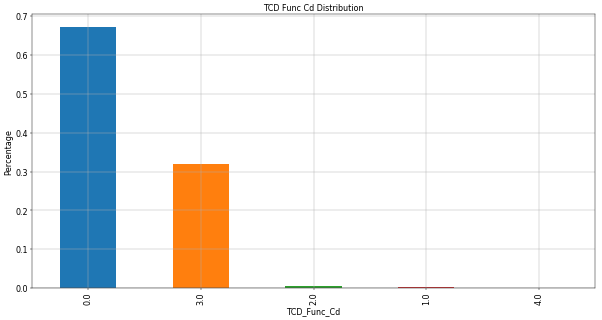

In [393]:
## TCD Func Cd Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('TCD_Func_Cd')
ax1.set_ylabel('Percentage')
ax1.set_title("TCD Func Cd Distribution")
temp15.plot(kind='bar', grid = True)

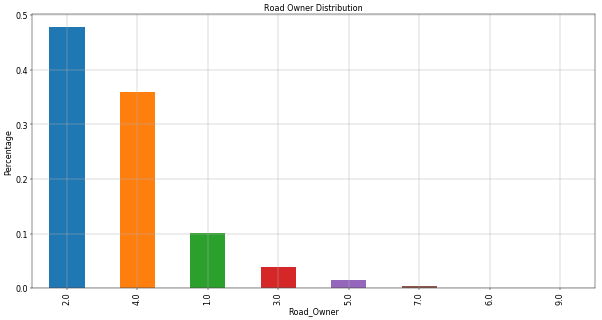

In [394]:
## Road Owner Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Road_Owner')
ax1.set_ylabel('Percentage')
ax1.set_title("Road Owner Distribution")
temp16.plot(kind='bar', grid = True)

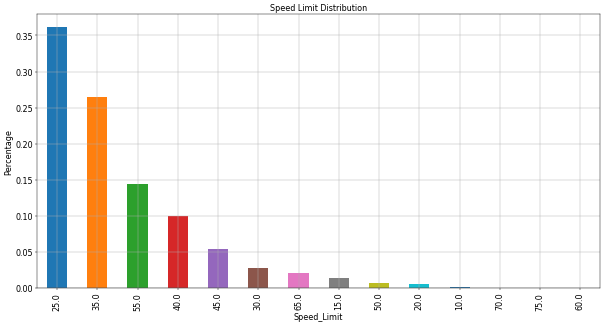

In [395]:
## Speed Limit Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Speed_Limit')
ax1.set_ylabel('Percentage')
ax1.set_title("Speed Limit Distribution")
temp17.plot(kind='bar', grid = True)

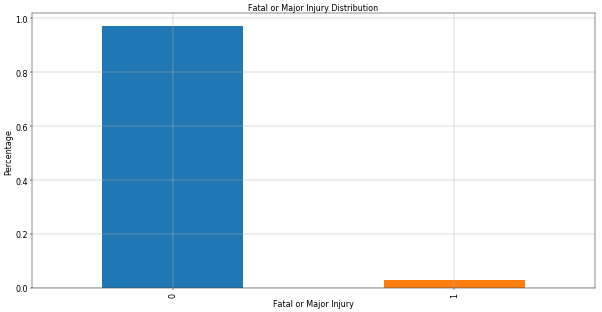

In [397]:
temp18 = crashdata["FATAL_OR_MAJ_INJ"].value_counts()/crashdata["FATAL_OR_MAJ_INJ"].count()

## Severity Distribution

fig = plt.figure(figsize=(40,20), dpi=40)

ax1 = fig.add_subplot(221)
ax1.set_xlabel('Fatal or Major Injury')
ax1.set_ylabel('Percentage')
ax1.set_title("Fatal or Major Injury Distribution")
temp18.plot(kind='bar', grid = True)

In [398]:
severeCnt = crashdata['FATAL_OR_MAJ_INJ'].sum()
print "Number of severe injuries: " + str(severeCnt)
print "Number of incidents: " + str(crashdata.shape[0])
print "Precentage of incidents with severe injury: " + str(((severeCnt*1.00)/crashdata.shape[0]) * 100)

Number of severe injuries: 3915
Number of incidents: 130901
Precentage of incidents with severe injury: 2.9908098486642576


In [399]:
# Driver age counts
# This is incomplete; drivers aged 21 - 49 are not captured

Total16 = crashdata['DRIVER_16YR'].sum()
print "Drivers 16 yrs: " + str(Total16)

Total17 = crashdata['DRIVER_17YR'].sum()
print "Drivers 17 yrs: " + str(Total17)

Total18 = crashdata['DRIVER_18YR'].sum()
print "Drivers 18 yrs: " + str(Total18)

Total19 = crashdata['DRIVER_19YR'].sum()
print "Drivers 19 yrs: " + str(Total19)

Total20 = crashdata['DRIVER_20YR'].sum()
print "Drivers 20 yrs: " + str(Total20)

Total50 = crashdata['DRIVER_50_64YR'].sum()
print "Drivers 50 to 64 yrs: " + str(Total50)

Total65 = crashdata['DRIVER_65_74YR'].sum()
print "Drivers 65 to 74 yrs: " + str(Total65)

Total75 = crashdata['DRIVER_75PLUS'].sum()
print "Drivers 75+ yrs: " + str(Total75)

Drivers 16 yrs: 1835
Drivers 17 yrs: 4840
Drivers 18 yrs: 5828
Drivers 19 yrs: 6118
Drivers 20 yrs: 6258
Drivers 50 to 64 yrs: 37880
Drivers 65 to 74 yrs: 11108
Drivers 75+ yrs: 8280


In [400]:
# isolate target variable
crashtarget = crashdata['FATAL_OR_MAJ_INJ']
crashtarget.head()

0    0
1    0
2    0
3    0
4    0
Name: FATAL_OR_MAJ_INJ, dtype: int64

In [401]:
# remove target variable from data
crashdata.drop(['FATAL_OR_MAJ_INJ'], axis=1, inplace=True)
crashdata.head()

,MUNICIPALITY,CRASH_YEAR,CRASH_MONTH,DAY_OF_WEEK,HOUR_OF_DAY,ILLUMINATION,WEATHER,ROAD_CONDITION,COLLISION_TYPE,RELATION_TO_ROAD,INTERSECT_TYPE,TCD_TYPE,URBAN_RURAL,LOCATION_TYPE,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,UNBELTED_OCC_COUNT,PED_COUNT,COMM_VEH_COUNT,TCD_FUNC_CD,TFC_DETOUR_IND,WORK_ZONE_IND,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,NHTSA_AGG_DRIVING,RUNNING_STOP_SIGN,TRAIN,TROLLEY,ROAD_OWNER,SPEED_LIMIT
0,2454,2004,1,5,2.0,2,1.0,0,7,2,0,0,3,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0.0,N,N,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,2.0,35.0
1,2440,2004,1,5,10.0,1,1.0,6,7,5,0,0,3,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0.0,Y,N,0,0,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3.0,35.0
2,2203,2004,1,5,18.0,2,1.0,0,7,5,3,3,3,0,1,1,1,0,0,0,0,0,0,0,0,0,0,3.0,N,N,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2.0,35.0
3,2404,2004,1,6,9.0,1,1.0,1,4,1,1,2,3,0,3,2,1,0,0,0,1,0,0,0,0,0,1,3.0,N,N,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4.0,25.0
4,2419,2004,1,5,22.0,3,1.0,0,1,1,0,0,3,0,1,2,1,0,0,0,0,0,0,0,0,0,0,0.0,N,N,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,4.0,20.0


In [402]:
# Replace all Y/N columns with 1/0

crashdata['TFC_DETOUR_IND'].replace('N',0, inplace=True)
crashdata['TFC_DETOUR_IND'].replace('Y',1, inplace=True)

crashdata['WORK_ZONE_IND'].replace('N',0, inplace=True)
crashdata['WORK_ZONE_IND'].replace('Y',1, inplace=True)

In [403]:
crashdata[['TFC_DETOUR_IND', 'WORK_ZONE_IND']].head()

,TFC_DETOUR_IND,WORK_ZONE_IND
0,0,0
1,1,0
2,0,0
3,0,0
4,0,0


In [404]:
crashdata.dtypes

MUNICIPALITY              int64
CRASH_YEAR                int64
CRASH_MONTH               int64
DAY_OF_WEEK               int64
HOUR_OF_DAY             float64
ILLUMINATION              int64
WEATHER                 float64
ROAD_CONDITION            int64
COLLISION_TYPE            int64
RELATION_TO_ROAD          int64
INTERSECT_TYPE            int64
TCD_TYPE                  int64
URBAN_RURAL               int64
LOCATION_TYPE             int64
PERSON_COUNT              int64
VEHICLE_COUNT             int64
AUTOMOBILE_COUNT          int64
MOTORCYCLE_COUNT          int64
BUS_COUNT                 int64
SMALL_TRUCK_COUNT         int64
HEAVY_TRUCK_COUNT         int64
SUV_COUNT                 int64
VAN_COUNT                 int64
BICYCLE_COUNT             int64
UNBELTED_OCC_COUNT        int64
PED_COUNT                 int64
COMM_VEH_COUNT            int64
TCD_FUNC_CD             float64
TFC_DETOUR_IND            int64
WORK_ZONE_IND             int64
INTERSTATE                int64
STATE_RO

In [405]:
# Categorical Variables

# MUNICIPALITY
# CRASH_YEAR
# CRASH_MONTH
# DAY_OF_WEEK
# HOUR_OF_DAY
# ILLUMINATION
# WEATHER
# ROAD_CONDITION
# COLLISION_TYPE
# RELATION_TO_ROAD
# INTERSECT_TYPE
# TCD_TYPE
# URBAN_RURAL
# LOCATION_TYPE
# TCD_FUNC_CD
# ROAD_OWNER
# SPEED_LIMIT

# It is necessary to convert to category types in order to use pandas get_dummies
crashdata["MUNICIPALITY"] = crashdata["MUNICIPALITY"].astype('category')
crashdata["CRASH_YEAR"] = crashdata["CRASH_YEAR"].astype('category')
crashdata["CRASH_MONTH"] = crashdata["CRASH_MONTH"].astype('category')
crashdata["DAY_OF_WEEK"] = crashdata["DAY_OF_WEEK"].astype('category')
crashdata["HOUR_OF_DAY"] = crashdata["HOUR_OF_DAY"].astype('category')
crashdata["ILLUMINATION"] = crashdata["ILLUMINATION"].astype('category')
crashdata["WEATHER"] = crashdata["WEATHER"].astype('category')
crashdata["ROAD_CONDITION"] = crashdata["ROAD_CONDITION"].astype('category')
crashdata["COLLISION_TYPE"] = crashdata["COLLISION_TYPE"].astype('category')
crashdata["RELATION_TO_ROAD"] = crashdata["RELATION_TO_ROAD"].astype('category')
crashdata["INTERSECT_TYPE"] = crashdata["INTERSECT_TYPE"].astype('category')
crashdata["TCD_TYPE"] = crashdata["TCD_TYPE"].astype('category')
crashdata["URBAN_RURAL"] = crashdata["URBAN_RURAL"].astype('category')
crashdata["LOCATION_TYPE"] = crashdata["LOCATION_TYPE"].astype('category')
crashdata["TCD_FUNC_CD"] = crashdata["TCD_FUNC_CD"].astype('category')
crashdata["ROAD_OWNER"] = crashdata["ROAD_OWNER"].astype('category')
crashdata["SPEED_LIMIT"] = crashdata["SPEED_LIMIT"].astype('category')

crashdummies = pd.get_dummies(crashdata)
crashdummies.head(10)

,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,UNBELTED_OCC_COUNT,PED_COUNT,COMM_VEH_COUNT,TFC_DETOUR_IND,WORK_ZONE_IND,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,NHTSA_AGG_DRIVING,RUNNING_STOP_SIGN,TRAIN,TROLLEY,MUNICIPALITY_2101,MUNICIPALITY_2102,MUNICIPALITY_2103,MUNICIPALITY_2104,MUNICIPALITY_2105,MUNICIPALITY_2106,MUNICIPALITY_2107,MUNICIPALITY_2108,MUNICIPALITY_2109,MUNICIPALITY_2110,MUNICIPALITY_2111,MUNICIPALITY_2112,MUNICIPALITY_2113,MUNICIPALITY_2114,MUNICIPALITY_2115,MUNICIPALITY_2116,MUNICIPALITY_2117,MUNICIPALITY_2118,MUNICIPALITY_2119,MUNICIPALITY_2120,MUNICIPALITY_2121,MUNICIPALITY_2122,MUNICIPALITY_2123,MUNICIPALITY_2124,MUNICIPALITY_2125,MUNICIPALITY_2126,MUNICIPALITY_2202,MUNICIPALITY_2203,MUNICIPALITY_2204,MUNICIPALITY_2206,MUNICIPALITY_2207,MUNICIPALITY_2208,MUNICIPALITY_2209,MUNICIPALITY_2211,MUNICIPALITY_2212,MUNICIPALITY_2213,MUNICIPALITY_2214,MUNICIPALITY_2215,MUNICIPALITY_2216,MUNICIPALITY_2217,MUNICIPALITY_2219,MUNICIPALITY_2220,MUNICIPALITY_2301,MUNICIPALITY_2302,MUNICIPALITY_2303,MUNICIPALITY_2304,MUNICIPALITY_2401,MUNICIPALITY_2402,MUNICIPALITY_2403,MUNICIPALITY_2404,MUNICIPALITY_2405,MUNICIPALITY_2406,MUNICIPALITY_2407,MUNICIPALITY_2408,MUNICIPALITY_2409,MUNICIPALITY_2410,MUNICIPALITY_2411,MUNICIPALITY_2412,MUNICIPALITY_2413,MUNICIPALITY_2414,MUNICIPALITY_2415,MUNICIPALITY_2416,MUNICIPALITY_2417,MUNICIPALITY_2418,MUNICIPALITY_2419,MUNICIPALITY_2420,MUNICIPALITY_2421,MUNICIPALITY_2422,MUNICIPALITY_2423,MUNICIPALITY_2424,MUNICIPALITY_2425,MUNICIPALITY_2426,MUNICIPALITY_2427,MUNICIPALITY_2428,MUNICIPALITY_2429,MUNICIPALITY_2430,MUNICIPALITY_2431,MUNICIPALITY_2432,MUNICIPALITY_2433,MUNICIPALITY_2434,MUNICIPALITY_2435,MUNICIPALITY_2436,MUNICIPALITY_2437,MUNICIPALITY_2438,MUNICIPALITY_2439,MUNICIPALITY_2440,MUNICIPALITY_2441,MUNICIPALITY_2442,MUNICIPALITY_2443,MUNICIPALITY_2444,MUNICIPALITY_2445,MUNICIPALITY_2446,MUNICIPALITY_2447,MUNICIPALITY_2448,MUNICIPALITY_2449,MUNICIPALITY_2450,MUNICIPALITY_2451,MUNICIPALITY_2452,MUNICIPALITY_2453,MUNICIPALITY_2454,MUNICIPALITY_2455,MUNICIPALITY_2456,MUNICIPALITY_2457,MUNICIPALITY_2458,MUNICIPALITY_2459,MUNICIPALITY_2460,MUNICIPALITY_2461,MUNICIPALITY_2462,MUNICIPALITY_2463,MUNICIPALITY_2464,MUNICIPALITY_2465,MUNICIPALITY_2466,MUNICIPALITY_2467,MUNICIPALITY_2468,MUNICIPALITY_2469,MUNICIPALITY_2470,MUNICIPALITY_2471,MUNICIPALITY_2472,MUNICIPALITY_2473,MUNICIPALITY_2474,MUNICIPALITY_2475,MUNICIPALITY_2476,MUNICIPALITY_2477,MUNICIPALITY_2478,MUNICIPALITY_2479,MUNICIPALITY_2480,MUNICIPALITY_2481,MUNICIPALITY_2482,MUNICIPALITY_2490,MUNICIPALITY_2491,CRASH_YEAR_2004,CRASH_YEAR_2005,CRASH_YEAR_2006,CRASH_YEAR_2007,CRASH_YEAR_2008,CRASH_YEAR_2009,CRASH_YEAR_2010,CRASH_YEAR_2011,CRASH_YEAR_2012,CRASH_YEAR_2013,CRASH_YEAR_2014,CRASH_YEAR_2015,CRASH_YEAR_2016,CRASH_YEAR_2017,CRASH_MONTH_1,CRASH_MONTH_2,CRASH_MONTH_3,CRASH_MONTH_4,CRASH_MONTH_5,CRASH_MONTH_6,CRASH_MONTH_7,CRASH_MONTH_8,CRASH_MONTH_9,CRASH_MONTH_10,CRASH_MONTH_11,CRASH_MONTH_12,DAY_OF_WEEK

In [407]:
# Examine correlations

# append target variable
df = pd.concat([crashtarget, crashdummies], axis=1)

# create correlation object
cc = np.corrcoef(df.T)
#np.savetxt("corrcoef.csv", np.corrcoef(df.T), delimiter=",")

## see output file corrcoef.csv which is formatted for viewing
## The file was modified outside of Jupyter to add column and row headings
np.savetxt("corrcoef_cc.csv", cc, delimiter=",")

# display results
cc

array([[ 1.  ,  0.01, -0.04, -0.06,  0.17,  0.01, -0.01,  0.02, -0.02, -0.01,  0.02,  0.1 ,  0.14,  0.02,  0.19,  0.  , -0.01,  0.01, -0.01, -0.01, -0.01, -0.02, -0.02, -0.02, -0.02,  0.  , -0.06,  0.04,  0.02,  0.03,  0.  , -0.03, -0.01, -0.01, -0.02,  0.  ,  0.01, -0.02,  0.03,  0.02,  0.03,  0.02,  0.  ,  0.  ,  0.02,  0.06,  0.17,  0.02,  0.02,  0.  , -0.  , -0.  ,  0.1 ,  0.09,  0.03,  0.01, -0.  , -0.02, -0.01, -0.03,  0.05,  0.04,  0.1 ,  0.04, -0.02, -0.  , -0.01, -0.01,  0.  ,  0.01,
         0.11,  0.14, -0.03,  0.03, -0.01, -0.01, -0.01, -0.  ,  0.01, -0.  ,  0.13,  0.06,  0.02,  0.1 , -0.02,  0.06,  0.01,  0.04,  0.04,  0.03,  0.  , -0.  , -0.  , -0.  ,  0.  ,  0.01,  0.  ,  0.  ,  0.01,  0.  , -0.01, -0.01, -0.  ,  0.  , -0.  ,  0.  ,  0.  , -0.01, -0.01, -0.  ,  0.02, -0.  , -0.  ,  0.01,  0.01, -0.  ,  0.01,  0.  ,  0.01,  0.01, -0.  ,  0.02,  0.  ,  0.  , -0.  , -0.  ,  0.  , -0.  ,  0.  ,  0.  , -0.  , -0.01, -0.  ,  0.01,  0.01, -0.01,  0.01,  0.01,  0.01, -0.  ,
    

__Although no strong correlations, there are some weak positive correlations between the target variable, FATAL_OR_MAJ_INJ, several other variables. Let's look at those relationships specifically for easier consumption.__

In [408]:
# look at some specific correlations
# Note COLLISION_TYPE_8 = Hit Pedestrian
df[["FATAL_OR_MAJ_INJ","TFC_DETOUR_IND","MOTORCYCLE", "ALCOHOL_RELATED", "SPEEDING", "UNBELTED", "PEDESTRIAN", "COLLISION_TYPE_8"]].corr()

,FATAL_OR_MAJ_INJ,TFC_DETOUR_IND,MOTORCYCLE,ALCOHOL_RELATED,SPEEDING,UNBELTED,PEDESTRIAN,COLLISION_TYPE_8
FATAL_OR_MAJ_INJ,1.000000,0.185354,0.170335,0.101976,0.099721,0.106266,0.139216,0.129132
TFC_DETOUR_IND,0.185354,1.000000,0.032672,0.081682,0.072981,0.072684,0.029591,0.025042
MOTORCYCLE,0.170335,0.032672,1.000000,0.007179,0.030462,-0.042161,-0.017822,-0.017615
ALCOHOL_RELATED,0.101976,0.081682,0.007179,1.000000,0.142699,0.119283,0.006511,0.004937
SPEEDING,0.099721,0.072981,0.030462,0.142699,1.000000,0.078017,-0.023220,-0.024384
UNBELTED,0.106266,0.072684,-0.042161,0.119283,0.078017,1.000000,-0.017751,-0.018666
PEDESTRIAN,0.139216,0.029591,-0.017822,0.006511,-0.023220,-0.017751,1.000000,0.955951
COLLISION_TYPE_8,0.129132,0.025042,-0.017615,0.004937,-0.024384,-0.018666,0.955951,1.000000


In [409]:
# Required to execute due to memory constraints
# launch Jupyter from the command prompt using:
# jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10 

c = crashdummies.corr().abs()
s = c.unstack()
so = s.sort_values(kind="quicksort")
print so

# come back to this, may remove more features

WORK_ZONE_IND         HOUR_OF_DAY_4.0         1.155888e-08
HOUR_OF_DAY_4.0       WORK_ZONE               1.155888e-08
WORK_ZONE             HOUR_OF_DAY_4.0         1.155888e-08
HOUR_OF_DAY_4.0       WORK_ZONE_IND           1.155888e-08
INTERSECT_TYPE_6      HOUR_OF_DAY_9.0         2.018777e-07
HOUR_OF_DAY_9.0       INTERSECT_TYPE_6        2.018777e-07
                      MUNICIPALITY_2426       4.134160e-07
MUNICIPALITY_2426     HOUR_OF_DAY_9.0         4.134160e-07
MUNICIPALITY_2432     COLLISION_TYPE_9        5.227803e-07
COLLISION_TYPE_9      MUNICIPALITY_2432       5.227803e-07
LOCAL_ROAD            MUNICIPALITY_2450       7.675669e-07
MUNICIPALITY_2450     LOCAL_ROAD              7.675669e-07
ROAD_OWNER_6.0        CRASH_YEAR_2006         8.384972e-07
CRASH_YEAR_2006       ROAD_OWNER_6.0          8.384972e-07
LOCATION_TYPE_1       MUNICIPALITY_2422       9.104836e-07
MUNICIPALITY_2422     LOCATION_TYPE_1         9.104836e-07
CRASH_YEAR_2009       MUNICIPALITY_2437       1.003560e-

## remove this section


__In the above output, we are looking for values greater than .5, representing moderate to high correlations. In this data set, there are about 115 pairs of variables that fall into this range. I've elected to remove certain variables with correlations greater than .7 and let PCA handle the rest.__

| Var1 | Var2 | Score |
| --- | --- | --- |
| BICYCLE | __BICYCLE_COUNT__ | .9964 |
| DRUGGED_DRIVER | __DRUG_RELATED__ | .9947 |
| MOTORCYCLE | __MOTORCYCLE_COUNT__ | .9887 |
| DRINKING_DRIVER | __ALCOHOL_RELATED__ | .9870 |
| HVY_TRUCK_RELATED | __HEAVY_TRUCK_COUNT__ | .9803 |
| TCD_TYPE_0 | __TCD_FUNC_CD_3.0__ | .9803 |
| __TCD_FUNC_CD_3.0__ | TCD_FUNC_CD_0.0 | .9803 |
| __COMM_VEH_COUNT__ | COMM_VEHICLE | .9800 |
| __ROAD_OWNER_5.0__ | TURNPIKE | .9670 |
| STATE_ROAD | __LOCAL_ROAD_ONLY__ | .9659 |
| PEDESTRIAN | __PED_COUNT__ | .9633 |
| __TCD_TYPE_3__ | STOP_CONTROLLED_INT | .9611 |
| DEER_RELATED | __SUDDEN_DEER__ | .9590 |
| __COLLISION_TYPE_8__ | PEDESTRIAN | .9560 |
| __ROAD_OWNER_1__ | INTERSTATE | .9477 |
| DRINKING_DRIVER | __IMPAIRED_DRIVER__ | .9294 |
| __ILLUMINATION_1__ | ILLUMINATION_DARK | .9294 |
| __IMPAIRED_DRIVER__ | __ALCOHOL_RELATED__ | .9227 |
| __TCD_TYPE_2__ | SIGNALIZED_INT | .9141 |
| __COLLISION_TYPE_8__ | __PED_COUNT__ | .9096 |
| SV_RUN_OFF_RD | __RELATION_TO_ROAD_1__ | .8919 |
| __HIT_FIXED_OBJECT__ | SV_RUN_OFF_RD | .8802 |
| SV_RUN_OFF_RD | __COLLISION_TYPE_7__ | .8802 |
| ROAD_OWNER_4 | __LOCAL_ROAD_ONLY__ | .8703 |
| __COLLISION_TYPE_7__ | __RELATION_TO_ROAD_1__ | .8554 |
| __RELATION_TO_ROAD_1__ | __HIT_FIXED_OBJECT__ | .8554 |
| __ROAD_CONDITION_3__ | SNOW_SLUSH_ROAD | .8524 |
| __ILLUMINATION_3__ | ILLUMINATION_DARK | .8415 |
| STATE_ROAD | __ROAD_OWNER_4__ | .8385 |
| UNBELTED | __UNBELTED_OCC_COUNT__ | .8351 |
| __COLLISION_TYPE_9__ | HIT_DEER | .8340 |
| WEATHER_1.0 | __ROAD_CONDITION_0__ | .8216 |
| HO_OPPDIR_SDSWP | __COLLISION_TYPE_2__ | .7984 |
| ILLUMINATION_1 | __ILLUMINATION_3__ | .7820 |
| DEER_RELATED | __DEER_HIT__ | .7820 |
| STATE_ROAD | __ROAD_OWNER_2.0__ | .7818 |
| HEAVY_TRUCK_COUNT | __COMM_VEH_COUNT__ | .7809 |
| __SUDDEN_DEER__ | __HIT_DEER__ | .7796 |
| COMM_VEHICLE | __HVY_TRUCK_RELATED__ | .7735 |
| __HEAVY_TRUCK_COUNT__ | COMM_VEHICLE | .7647 |
| __COMM_VEH_COUNT__ | __HVY_TRUCK_RELATED__ | .7645 |
| __LOCAL_ROAD_ONLY__ | __ROAD_OWNER_2__ | .7552 |
| __ROAD_CONDITION_0__ | ROAD_CONDITION_1 | .7467 |
| WET_ROAD | __ROAD_CONDITION_0__ | .7467 |
| WEATHER_2.0 | WET_ROAD | .7418 |
| WEATHER_2.0 | ROAD_CONDITION_1 | .7418 |
| TRAIN_TROLLEY | TRAIN | .7237 |
| ROAD_OWNER_2.0 | ROAD_OWNER_4.0 | .7171 |
| ROAD_CONDITION_5 | ICY_ROAD | .7094 |
| WEATHER_1.0 | WEATHER_2.0 | .7082 |

In [410]:
from sklearn.model_selection import train_test_split

# test_size: what proportion of original data is used for test set
train_crash, test_crash, train_y, test_y = train_test_split(crashdummies, crashtarget, test_size=0.2, random_state=33)

In [47]:
# let's not do this.
# There are a few features that are counts, but do not have extreme values

#from sklearn.preprocessing import StandardScaler
#scaler = StandardScaler()

# Fit on training set only.
#scaler.fit(train_crash)

# Apply transform to both the training set and the test set.
#train_crash = scaler.transform(train_crash)
#test_crash = scaler.transform(test_crash)

In [411]:
train_crash[:5]

,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,UNBELTED_OCC_COUNT,PED_COUNT,COMM_VEH_COUNT,TFC_DETOUR_IND,WORK_ZONE_IND,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,NHTSA_AGG_DRIVING,RUNNING_STOP_SIGN,TRAIN,TROLLEY,MUNICIPALITY_2101,MUNICIPALITY_2102,MUNICIPALITY_2103,MUNICIPALITY_2104,MUNICIPALITY_2105,MUNICIPALITY_2106,MUNICIPALITY_2107,MUNICIPALITY_2108,MUNICIPALITY_2109,MUNICIPALITY_2110,MUNICIPALITY_2111,MUNICIPALITY_2112,MUNICIPALITY_2113,MUNICIPALITY_2114,MUNICIPALITY_2115,MUNICIPALITY_2116,MUNICIPALITY_2117,MUNICIPALITY_2118,MUNICIPALITY_2119,MUNICIPALITY_2120,MUNICIPALITY_2121,MUNICIPALITY_2122,MUNICIPALITY_2123,MUNICIPALITY_2124,MUNICIPALITY_2125,MUNICIPALITY_2126,MUNICIPALITY_2202,MUNICIPALITY_2203,MUNICIPALITY_2204,MUNICIPALITY_2206,MUNICIPALITY_2207,MUNICIPALITY_2208,MUNICIPALITY_2209,MUNICIPALITY_2211,MUNICIPALITY_2212,MUNICIPALITY_2213,MUNICIPALITY_2214,MUNICIPALITY_2215,MUNICIPALITY_2216,MUNICIPALITY_2217,MUNICIPALITY_2219,MUNICIPALITY_2220,MUNICIPALITY_2301,MUNICIPALITY_2302,MUNICIPALITY_2303,MUNICIPALITY_2304,MUNICIPALITY_2401,MUNICIPALITY_2402,MUNICIPALITY_2403,MUNICIPALITY_2404,MUNICIPALITY_2405,MUNICIPALITY_2406,MUNICIPALITY_2407,MUNICIPALITY_2408,MUNICIPALITY_2409,MUNICIPALITY_2410,MUNICIPALITY_2411,MUNICIPALITY_2412,MUNICIPALITY_2413,MUNICIPALITY_2414,MUNICIPALITY_2415,MUNICIPALITY_2416,MUNICIPALITY_2417,MUNICIPALITY_2418,MUNICIPALITY_2419,MUNICIPALITY_2420,MUNICIPALITY_2421,MUNICIPALITY_2422,MUNICIPALITY_2423,MUNICIPALITY_2424,MUNICIPALITY_2425,MUNICIPALITY_2426,MUNICIPALITY_2427,MUNICIPALITY_2428,MUNICIPALITY_2429,MUNICIPALITY_2430,MUNICIPALITY_2431,MUNICIPALITY_2432,MUNICIPALITY_2433,MUNICIPALITY_2434,MUNICIPALITY_2435,MUNICIPALITY_2436,MUNICIPALITY_2437,MUNICIPALITY_2438,MUNICIPALITY_2439,MUNICIPALITY_2440,MUNICIPALITY_2441,MUNICIPALITY_2442,MUNICIPALITY_2443,MUNICIPALITY_2444,MUNICIPALITY_2445,MUNICIPALITY_2446,MUNICIPALITY_2447,MUNICIPALITY_2448,MUNICIPALITY_2449,MUNICIPALITY_2450,MUNICIPALITY_2451,MUNICIPALITY_2452,MUNICIPALITY_2453,MUNICIPALITY_2454,MUNICIPALITY_2455,MUNICIPALITY_2456,MUNICIPALITY_2457,MUNICIPALITY_2458,MUNICIPALITY_2459,MUNICIPALITY_2460,MUNICIPALITY_2461,MUNICIPALITY_2462,MUNICIPALITY_2463,MUNICIPALITY_2464,MUNICIPALITY_2465,MUNICIPALITY_2466,MUNICIPALITY_2467,MUNICIPALITY_2468,MUNICIPALITY_2469,MUNICIPALITY_2470,MUNICIPALITY_2471,MUNICIPALITY_2472,MUNICIPALITY_2473,MUNICIPALITY_2474,MUNICIPALITY_2475,MUNICIPALITY_2476,MUNICIPALITY_2477,MUNICIPALITY_2478,MUNICIPALITY_2479,MUNICIPALITY_2480,MUNICIPALITY_2481,MUNICIPALITY_2482,MUNICIPALITY_2490,MUNICIPALITY_2491,CRASH_YEAR_2004,CRASH_YEAR_2005,CRASH_YEAR_2006,CRASH_YEAR_2007,CRASH_YEAR_2008,CRASH_YEAR_2009,CRASH_YEAR_2010,CRASH_YEAR_2011,CRASH_YEAR_2012,CRASH_YEAR_2013,CRASH_YEAR_2014,CRASH_YEAR_2015,CRASH_YEAR_2016,CRASH_YEAR_2017,CRASH_MONTH_1,CRASH_MONTH_2,CRASH_MONTH_3,CRASH_MONTH_4,CRASH_MONTH_5,CRASH_MONTH_6,CRASH_MONTH_7,CRASH_MONTH_8,CRASH_MONTH_9,CRASH_MONTH_10,CRASH_MONTH_11,CRASH_MONTH_12,DAY_OF_WEEK

In [412]:
test_crash[:5]

,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,UNBELTED_OCC_COUNT,PED_COUNT,COMM_VEH_COUNT,TFC_DETOUR_IND,WORK_ZONE_IND,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,NHTSA_AGG_DRIVING,RUNNING_STOP_SIGN,TRAIN,TROLLEY,MUNICIPALITY_2101,MUNICIPALITY_2102,MUNICIPALITY_2103,MUNICIPALITY_2104,MUNICIPALITY_2105,MUNICIPALITY_2106,MUNICIPALITY_2107,MUNICIPALITY_2108,MUNICIPALITY_2109,MUNICIPALITY_2110,MUNICIPALITY_2111,MUNICIPALITY_2112,MUNICIPALITY_2113,MUNICIPALITY_2114,MUNICIPALITY_2115,MUNICIPALITY_2116,MUNICIPALITY_2117,MUNICIPALITY_2118,MUNICIPALITY_2119,MUNICIPALITY_2120,MUNICIPALITY_2121,MUNICIPALITY_2122,MUNICIPALITY_2123,MUNICIPALITY_2124,MUNICIPALITY_2125,MUNICIPALITY_2126,MUNICIPALITY_2202,MUNICIPALITY_2203,MUNICIPALITY_2204,MUNICIPALITY_2206,MUNICIPALITY_2207,MUNICIPALITY_2208,MUNICIPALITY_2209,MUNICIPALITY_2211,MUNICIPALITY_2212,MUNICIPALITY_2213,MUNICIPALITY_2214,MUNICIPALITY_2215,MUNICIPALITY_2216,MUNICIPALITY_2217,MUNICIPALITY_2219,MUNICIPALITY_2220,MUNICIPALITY_2301,MUNICIPALITY_2302,MUNICIPALITY_2303,MUNICIPALITY_2304,MUNICIPALITY_2401,MUNICIPALITY_2402,MUNICIPALITY_2403,MUNICIPALITY_2404,MUNICIPALITY_2405,MUNICIPALITY_2406,MUNICIPALITY_2407,MUNICIPALITY_2408,MUNICIPALITY_2409,MUNICIPALITY_2410,MUNICIPALITY_2411,MUNICIPALITY_2412,MUNICIPALITY_2413,MUNICIPALITY_2414,MUNICIPALITY_2415,MUNICIPALITY_2416,MUNICIPALITY_2417,MUNICIPALITY_2418,MUNICIPALITY_2419,MUNICIPALITY_2420,MUNICIPALITY_2421,MUNICIPALITY_2422,MUNICIPALITY_2423,MUNICIPALITY_2424,MUNICIPALITY_2425,MUNICIPALITY_2426,MUNICIPALITY_2427,MUNICIPALITY_2428,MUNICIPALITY_2429,MUNICIPALITY_2430,MUNICIPALITY_2431,MUNICIPALITY_2432,MUNICIPALITY_2433,MUNICIPALITY_2434,MUNICIPALITY_2435,MUNICIPALITY_2436,MUNICIPALITY_2437,MUNICIPALITY_2438,MUNICIPALITY_2439,MUNICIPALITY_2440,MUNICIPALITY_2441,MUNICIPALITY_2442,MUNICIPALITY_2443,MUNICIPALITY_2444,MUNICIPALITY_2445,MUNICIPALITY_2446,MUNICIPALITY_2447,MUNICIPALITY_2448,MUNICIPALITY_2449,MUNICIPALITY_2450,MUNICIPALITY_2451,MUNICIPALITY_2452,MUNICIPALITY_2453,MUNICIPALITY_2454,MUNICIPALITY_2455,MUNICIPALITY_2456,MUNICIPALITY_2457,MUNICIPALITY_2458,MUNICIPALITY_2459,MUNICIPALITY_2460,MUNICIPALITY_2461,MUNICIPALITY_2462,MUNICIPALITY_2463,MUNICIPALITY_2464,MUNICIPALITY_2465,MUNICIPALITY_2466,MUNICIPALITY_2467,MUNICIPALITY_2468,MUNICIPALITY_2469,MUNICIPALITY_2470,MUNICIPALITY_2471,MUNICIPALITY_2472,MUNICIPALITY_2473,MUNICIPALITY_2474,MUNICIPALITY_2475,MUNICIPALITY_2476,MUNICIPALITY_2477,MUNICIPALITY_2478,MUNICIPALITY_2479,MUNICIPALITY_2480,MUNICIPALITY_2481,MUNICIPALITY_2482,MUNICIPALITY_2490,MUNICIPALITY_2491,CRASH_YEAR_2004,CRASH_YEAR_2005,CRASH_YEAR_2006,CRASH_YEAR_2007,CRASH_YEAR_2008,CRASH_YEAR_2009,CRASH_YEAR_2010,CRASH_YEAR_2011,CRASH_YEAR_2012,CRASH_YEAR_2013,CRASH_YEAR_2014,CRASH_YEAR_2015,CRASH_YEAR_2016,CRASH_YEAR_2017,CRASH_MONTH_1,CRASH_MONTH_2,CRASH_MONTH_3,CRASH_MONTH_4,CRASH_MONTH_5,CRASH_MONTH_6,CRASH_MONTH_7,CRASH_MONTH_8,CRASH_MONTH_9,CRASH_MONTH_10,CRASH_MONTH_11,CRASH_MONTH_12,DAY_OF_WEEK

In [413]:
from sklearn.decomposition import PCA

# Make an instance of the Model
pca = PCA(.95) # variance retained

In [414]:
pca.fit(train_crash)

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [415]:
# number of components selected
pca.n_components_

131

In [416]:
# lets try it with all so that we can graph the results
from sklearn import decomposition

n = crashdummies.shape[1]
pca2 = decomposition.PCA(n_components = n) # there are 371 features

crashdummies_pca = pca2.fit_transform(crashdummies)

variance = pca2.explained_variance_ratio_ #calculate variance ratios

var=np.cumsum(np.round(pca2.explained_variance_ratio_, decimals=3)*100)
var #cumulative sum of variance explained with [n] features


# This way identifies 132 instead of 131 features.

array([19.3, 26.6, 32.3, 36.6, 39.8, 42.7, 45.3, 47.3, 49.2, 51. , 52.7, 54.1, 55.3, 56.4, 57.5, 58.5, 59.5, 60.4, 61.3, 62.1, 62.9, 63.6, 64.3, 65. , 65.7, 66.4, 67.1, 67.7, 68.3, 68.9, 69.4, 69.9, 70.4, 70.9, 71.4, 71.9, 72.4, 72.9, 73.3, 73.7, 74.1, 74.5, 74.9, 75.3, 75.7, 76.1, 76.5, 76.9, 77.3, 77.7, 78.1, 78.5, 78.8, 79.1, 79.4, 79.7, 80. , 80.3, 80.6, 80.9, 81.2, 81.5, 81.8, 82.1, 82.4, 82.7, 83. , 83.3, 83.6, 83.9, 84.2, 84.5, 84.8, 85.1, 85.4, 85.7, 86. , 86.3, 86.6, 86.9, 87.1, 87.3,
       87.5, 87.7, 87.9, 88.1, 88.3, 88.5, 88.7, 88.9, 89.1, 89.3, 89.5, 89.7, 89.9, 90.1, 90.3, 90.5, 90.7, 90.9, 91.1, 91.3, 91.5, 91.7, 91.9, 92.1, 92.3, 92.5, 92.7, 92.8, 92.9, 93. , 93.1, 93.2, 93.3, 93.4, 93.5, 93.6, 93.7, 93.8, 93.9, 94. , 94.1, 94.2, 94.3, 94.4, 94.5, 94.6, 94.7, 94.8, 94.9, 95. , 95.1, 95.2, 95.3, 95.4, 95.5, 95.6, 95.7, 95.8, 95.9, 96. , 96.1, 96.2, 96.3, 96.4, 96.5, 96.6, 96.7, 96.8, 96.9, 97. , 97.1, 97.2, 97.3, 97.4, 97.5, 97.6, 97.7, 97.8, 97.9, 98. , 98.1, 98.2,
  

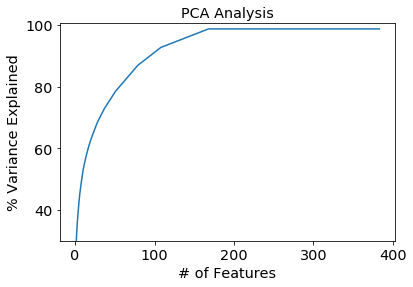

In [417]:
plt.ylabel('% Variance Explained')
plt.xlabel('# of Features')
plt.title('PCA Analysis')
plt.ylim(30,100.5)
plt.style.context('seaborn-whitegrid')

plt.plot(var)

In [ ]:
# Carry on with regression

In [418]:
train_crash_pca = pca.transform(train_crash)
test_crash_pca = pca.transform(test_crash)

In [419]:
train_crash_pca[:1]

array([[-1.8 ,  0.52, -0.66,  1.29, -0.36, -0.12,  1.  ,  0.66,  1.08, -0.28,  0.28, -0.43, -0.22,  0.58,  0.03,  0.14, -0.47,  0.39, -0.35,  0.24,  0.81,  0.63, -0.29,  0.38,  0.31, -0.14, -0.12, -0.24,  0.9 , -0.  ,  0.13, -0.01,  0.2 , -0.15, -0.11,  0.22, -0.1 ,  0.1 , -0.07, -0.08,  0.41,  0.73,  0.15, -0.23, -0.1 ,  0.53,  0.46, -0.07,  0.15, -0.31, -0.58, -0.03,  0.38,  0.03,  0.01, -0.59, -0.19, -0.02, -0.22, -0.11, -0.12,  0.17,  0.04, -0.15, -0.06,  0.09, -0.03, -0.14,  0.03, -0.07,
        -0.28,  0.06,  0.22,  0.28, -0.01,  0.14, -0.04,  0.16,  0.05, -0.05, -0.02,  0.01, -0.03, -0.16, -0.14, -0.26, -0.02, -0.06,  0.03,  0.07,  0.75,  0.21, -0.54, -0.22,  0.07, -0.26,  0.15,  0.07,  0.77,  0.49, -0.07,  0.07,  0.1 ,  0.07, -0.01,  0.08, -0.18, -0.01, -0.12, -0.03, -0.04,  0.06, -0.1 ,  0.09, -0.21, -0.25, -0.  , -0.05, -0.06, -0.1 ,  0.3 , -0.07, -0.04, -0.16, -0.2 ,  0.12, -0.03,  0.29,  0.25,  0.01, -0.12]])

In [420]:
from sklearn.linear_model import LogisticRegression

In [421]:
# used solver = 'lbfgs' to improve performance
logisticRegr = LogisticRegression(solver = 'lbfgs')

In [422]:
logisticRegr.fit(train_crash_pca, train_y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='lbfgs', tol=0.0001,
          verbose=0, warm_start=False)

In [423]:
logisticRegr.coef_

array([[-0.05,  0.21,  0.19,  0.22, -0.06,  0.37,  0.09, -0.02, -0.02,  0.59,  0.63,  0.21,  0.11,  0.29, -0.44, -0.27,  0.15, -0.29, -0.04, -0.29, -0.14,  0.54, -0.22,  0.03,  0.36, -0.11, -0.47, -0.04,  0.01, -0.07,  0.22, -1.02, -0.47,  0.6 , -0.06,  0.23,  1.04, -0.59,  0.06,  0.13,  0.86, -0.08, -0.11, -0.17, -0.09,  0.57,  0.06,  0.03,  0.08,  0.26,  0.07,  0.32, -0.18,  0.17, -0.1 ,  0.17, -0.43, -0.09,  0.02,  0.2 ,  0.41,  0.25, -0.51, -0.08, -0.  ,  0.38, -0.07,  0.21,  0.33, -0.47,
         0.38, -0.36, -0.16,  0.4 ,  0.25, -0.09, -0.68,  0.12,  0.48, -0.26,  0.15,  1.01,  0.52, -0.26,  0.22,  0.63,  0.46,  0.09,  0.27, -0.27,  0.15, -0.14, -0.24,  0.59, -0.36, -0.34, -0.04,  0.02, -0.04, -0.25, -0.06,  0.37,  0.91, -0.64, -0.24,  0.24, -0.35,  0.33, -0.04, -0.22, -0.13, -0.68,  0.03, -0.35, -0.81, -0.37,  0.08,  0.38, -0.08, -0.25,  0.27,  0.19, -0.21,  0.46,  0.03, -0.56, -0.38, -1.07, -0.  ,  0.26, -0.85]])

In [424]:
# The coefficients show a varying degree of importance. The four most important are are

#  1.04 PC 37
#  1.01 PC 82
# -1.07 PC 128
# -1.02 PC 32                    


In [425]:
df = pd.DataFrame(pca.components_, columns=list(train_crash.columns))
df

,PERSON_COUNT,VEHICLE_COUNT,AUTOMOBILE_COUNT,MOTORCYCLE_COUNT,BUS_COUNT,SMALL_TRUCK_COUNT,HEAVY_TRUCK_COUNT,SUV_COUNT,VAN_COUNT,BICYCLE_COUNT,UNBELTED_OCC_COUNT,PED_COUNT,COMM_VEH_COUNT,TFC_DETOUR_IND,WORK_ZONE_IND,INTERSTATE,STATE_ROAD,LOCAL_ROAD,LOCAL_ROAD_ONLY,TURNPIKE,WET_ROAD,SNOW_SLUSH_ROAD,ICY_ROAD,SUDDEN_DEER,SHLDR_RELATED,REAR_END,HO_OPPDIR_SDSWP,HIT_FIXED_OBJECT,SV_RUN_OFF_RD,WORK_ZONE,INTERSECTION,SIGNALIZED_INT,STOP_CONTROLLED_INT,UNSIGNALIZED_INT,SCHOOL_BUS,SCHOOL_ZONE,HIT_DEER,HIT_TREE_SHRUB,HIT_EMBANKMENT,HIT_POLE,HIT_GDRAIL,HIT_GDRAIL_END,HIT_BARRIER,HIT_BRIDGE,OVERTURNED,MOTORCYCLE,BICYCLE,HVY_TRUCK_RELATED,VEHICLE_FAILURE,TRAIN_TROLLEY,PHANTOM_VEHICLE,ALCOHOL_RELATED,DRINKING_DRIVER,UNDERAGE_DRNK_DRV,UNLICENSED,CELL_PHONE,NO_CLEARANCE,RUNNING_RED_LT,TAILGATING,CROSS_MEDIAN,CURVE_DVR_ERROR,SPEEDING,SPEEDING_RELATED,AGGRESSIVE_DRIVING,FATIGUE_ASLEEP,DRIVER_16YR,DRIVER_17YR,DRIVER_65_74YR,DRIVER_75PLUS,UNBELTED,PEDESTRIAN,DISTRACTED,CURVED_ROAD,DRIVER_18YR,DRIVER_19YR,DRIVER_20YR,DRIVER_50_64YR,FIRE_IN_VEHICLE,HIT_PARKED_VEHICLE,MC_DRINKING_DRIVER,DRUGGED_DRIVER,COMM_VEHICLE,IMPAIRED_DRIVER,DEER_RELATED,DRUG_RELATED,HAZARDOUS_TRUCK,ILLEGAL_DRUG_RELATED,ILLUMINATION_DARK,NHTSA_AGG_DRIVING,RUNNING_STOP_SIGN,TRAIN,TROLLEY,MUNICIPALITY_2101,MUNICIPALITY_2102,MUNICIPALITY_2103,MUNICIPALITY_2104,MUNICIPALITY_2105,MUNICIPALITY_2106,MUNICIPALITY_2107,MUNICIPALITY_2108,MUNICIPALITY_2109,MUNICIPALITY_2110,MUNICIPALITY_2111,MUNICIPALITY_2112,MUNICIPALITY_2113,MUNICIPALITY_2114,MUNICIPALITY_2115,MUNICIPALITY_2116,MUNICIPALITY_2117,MUNICIPALITY_2118,MUNICIPALITY_2119,MUNICIPALITY_2120,MUNICIPALITY_2121,MUNICIPALITY_2122,MUNICIPALITY_2123,MUNICIPALITY_2124,MUNICIPALITY_2125,MUNICIPALITY_2126,MUNICIPALITY_2202,MUNICIPALITY_2203,MUNICIPALITY_2204,MUNICIPALITY_2206,MUNICIPALITY_2207,MUNICIPALITY_2208,MUNICIPALITY_2209,MUNICIPALITY_2211,MUNICIPALITY_2212,MUNICIPALITY_2213,MUNICIPALITY_2214,MUNICIPALITY_2215,MUNICIPALITY_2216,MUNICIPALITY_2217,MUNICIPALITY_2219,MUNICIPALITY_2220,MUNICIPALITY_2301,MUNICIPALITY_2302,MUNICIPALITY_2303,MUNICIPALITY_2304,MUNICIPALITY_2401,MUNICIPALITY_2402,MUNICIPALITY_2403,MUNICIPALITY_2404,MUNICIPALITY_2405,MUNICIPALITY_2406,MUNICIPALITY_2407,MUNICIPALITY_2408,MUNICIPALITY_2409,MUNICIPALITY_2410,MUNICIPALITY_2411,MUNICIPALITY_2412,MUNICIPALITY_2413,MUNICIPALITY_2414,MUNICIPALITY_2415,MUNICIPALITY_2416,MUNICIPALITY_2417,MUNICIPALITY_2418,MUNICIPALITY_2419,MUNICIPALITY_2420,MUNICIPALITY_2421,MUNICIPALITY_2422,MUNICIPALITY_2423,MUNICIPALITY_2424,MUNICIPALITY_2425,MUNICIPALITY_2426,MUNICIPALITY_2427,MUNICIPALITY_2428,MUNICIPALITY_2429,MUNICIPALITY_2430,MUNICIPALITY_2431,MUNICIPALITY_2432,MUNICIPALITY_2433,MUNICIPALITY_2434,MUNICIPALITY_2435,MUNICIPALITY_2436,MUNICIPALITY_2437,MUNICIPALITY_2438,MUNICIPALITY_2439,MUNICIPALITY_2440,MUNICIPALITY_2441,MUNICIPALITY_2442,MUNICIPALITY_2443,MUNICIPALITY_2444,MUNICIPALITY_2445,MUNICIPALITY_2446,MUNICIPALITY_2447,MUNICIPALITY_2448,MUNICIPALITY_2449,MUNICIPALITY_2450,MUNICIPALITY_2451,MUNICIPALITY_2452,MUNICIPALITY_2453,MUNICIPALITY_2454,MUNICIPALITY_2455,MUNICIPALITY_2456,MUNICIPALITY_2457,MUNICIPALITY_2458,MUNICIPALITY_2459,MUNICIPALITY_2460,MUNICIPALITY_2461,MUNICIPALITY_2462,MUNICIPALITY_2463,MUNICIPALITY_2464,MUNICIPALITY_2465,MUNICIPALITY_2466,MUNICIPALITY_2467,MUNICIPALITY_2468,MUNICIPALITY_2469,MUNICIPALITY_2470,MUNICIPALITY_2471,MUNICIPALITY_2472,MUNICIPALITY_2473,MUNICIPALITY_2474,MUNICIPALITY_2475,MUNICIPALITY_2476,MUNICIPALITY_2477,MUNICIPALITY_2478,MUNICIPALITY_2479,MUNICIPALITY_2480,MUNICIPALITY_2481,MUNICIPALITY_2482,MUNICIPALITY_2490,MUNICIPALITY_2491,CRASH_YEAR_2004,CRASH_YEAR_2005,CRASH_YEAR_2006,CRASH_YEAR_2007,CRASH_YEAR_2008,CRASH_YEAR_2009,CRASH_YEAR_2010,CRASH_YEAR_2011,CRASH_YEAR_2012,CRASH_YEAR_2013,CRASH_YEAR_2014,CRASH_YEAR_2015,CRASH_YEAR_2016,CRASH_YEAR_2017,CRASH_MONTH_1,CRASH_MONTH_2,CRASH_MONTH_3,CRASH_MONTH_4,CRASH_MONTH_5,CRASH_MONTH_6,CRASH_MONTH_7,CRASH_MONTH_8,CRASH_MONTH_9,CRASH_MONTH_10,CRASH_MONTH_11,CRASH_MONTH_12,DAY_OF_WEEK

In [427]:
# generate predictions
pred = logisticRegr.predict(test_crash_pca)

# Compare some predictions to actual
print pred[0:50]
print ''
print np.array(test_y[0:50])

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [428]:
logisticRegr.score(test_crash_pca, test_y)

0.9704747717810626

In [429]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_y, pred)
print cm

[[25316    68]
 [  705    92]]


********************************************************************************************************************************

In [430]:
# This is great for prediction, but doesn't reveal the most important factors in crash severity. 
# Next lets try some feature selection so that we can see the impact of each feature

from sklearn.feature_selection import RFE

model = LogisticRegression(solver = 'lbfgs')
rfe = RFE(model, 3)
rfe = rfe.fit(crashdummies, crashtarget)

[False False False False False False False False False False False False False  True False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False  True False False False False False False False False False False False False False False False False False False False False False False False False  True False False False False False False False False False False False False
 False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False
 F

In [431]:
print("Num Features: %d"% rfe.n_features_) 
print("Selected Features: %s"% rfe.support_) 
print("Feature Ranking: %s"% rfe.ranking_)

Num Features: 3
Selected Features: [False False False False False False False False False False False False False  True False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False  True False False False False False False False False False False False False False False False False False False False False False False False False  True False False False False False False False False False False False False
 False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False Fal

In [432]:
pos = [14,46,71]
crashdummies.columns[pos]

Index([u'WORK_ZONE_IND', u'BICYCLE', u'DISTRACTED'], dtype='object')

In [433]:
# create a subset with most important features
crashreduced = crashdummies[['WORK_ZONE_IND','BICYCLE','DISTRACTED']]

In [434]:
# split into test and train
train_crashreduced, test_crashreduced, train_y, test_y = train_test_split(crashreduced, crashtarget, test_size=0.2, random_state=33)

In [435]:
# all parameters not specified are set to their defaults
# default solver is incredibly slow which is why it was changed to 'lbfgs'
logisticRegr = LogisticRegression(solver = 'lbfgs')
logisticRegr.fit(train_crashreduced, train_y)
print logisticRegr.score(test_crashreduced, test_y)
print ''

pred = logisticRegr.predict(test_crashreduced)

# Compare some predictions to actual
print pred[0:50]
print ''
print np.array(test_y[0:50])

print ''
print logisticRegr.coef_

0.9695580764676673

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[[ 0.14  1.02 -0.57]]


In [ ]:
# The coefficients (weights) with the corresponding feature:

#  0.14 WORK_ZONE_IND
#  1.02 BICYCLE
# -0.57 DISTRACTED

In [436]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_y, pred)
print cm

[[25384     0]
 [  797     0]]


********************************************************************************************************************************

In [437]:
# Expand to a few more features, let's use 10

from sklearn.feature_selection import RFE

model = LogisticRegression(solver = 'lbfgs')
rfe = RFE(model, 10)
rfe = rfe.fit(crashdummies, crashtarget)

In [438]:
print("Num Features: %d"% rfe.n_features_) 
print("Selected Features: %s"% rfe.support_) 
print("Feature Ranking: %s"% rfe.ranking_)

Num Features: 10
Selected Features: [False False False False False False False False False  True False False False  True False False False False False False False False False False False False False False False False False False False False False False False False False False False False False  True False  True False False False False False False False False False False False False False False False  True False False False False False False False  True  True False False False False False False False False False False False False
 False False False False False False False False False False False False False False False False False False False False False False False False False False  True False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False False Fa

In [439]:
# The indicies of the true values are 10, 14, 44, 46, 62, 70, 71, 110, 174, 368
# The corresponding columns are:
pos = [10, 14, 44, 46, 62, 70, 71, 110, 174, 368]
crashdummies.columns[pos]

Index([u'UNBELTED_OCC_COUNT', u'WORK_ZONE_IND', u'OVERTURNED', u'BICYCLE',
       u'SPEEDING_RELATED', u'PEDESTRIAN', u'DISTRACTED', u'MUNICIPALITY_2119',
       u'MUNICIPALITY_2437', u'ROAD_OWNER_7.0'],
      dtype='object')

In [440]:
# let's create a subset with just those 10 features
crashreduced2 = crashdummies[['UNBELTED_OCC_COUNT', 'WORK_ZONE_IND', 'OVERTURNED', 'BICYCLE',
                               'SPEEDING_RELATED', 'PEDESTRIAN', 'DISTRACTED', 'MUNICIPALITY_2119',
                               'MUNICIPALITY_2437', 'ROAD_OWNER_7.0']]

# note MUNICIPALITY_2119 is South Fayette Township and MUNICIPALITY_2437 is Heidelberg Borough
# ROAD_OWNER_7.0 = Private Road

In [441]:
crashreduced2[:10]

,UNBELTED_OCC_COUNT,WORK_ZONE_IND,OVERTURNED,BICYCLE,SPEEDING_RELATED,PEDESTRIAN,DISTRACTED,MUNICIPALITY_2119,MUNICIPALITY_2437,ROAD_OWNER_7.0
0,1,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0
6,2,0,0,0,1,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0


In [123]:
# split into test and train
train_crashreduced2, test_crashreduced2, train_y2, test_y2 = train_test_split(crashreduced2, crashtarget, 
                                                                              test_size=0.2, random_state=33)

In [442]:
# solver = 'lbfgs' is used to speed up processing

logisticRegr = LogisticRegression(solver = 'lbfgs')
logisticRegr.fit(train_crashreduced2, train_y2)
print logisticRegr.score(test_crashreduced2, test_y2)
print ''

pred = logisticRegr.predict(test_crashreduced2)

# Compare some predictions to actual
print pred[0:50]
print ''
print np.array(test_y2[0:50])

print ''
print logisticRegr.coef_

0.9693289026393186

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[[ 0.57  0.17  1.13  1.46  0.58  2.28 -0.42 -0.02 -0.12 -0.41]]


In [ ]:
# The coefficients (weights) with the corresponding feature:

#  0.57 UNBELTED_OCC_COUNT
#  0.17 WORK_ZONE_IND
#  1.13 OVERTURNED
#  1.46 BICYCLE                    
#  0.58 SPEEDING_RELATED
#  2.28 PEDESTRIAN
# -0.42 DISTRACTED
# -0.02 MUNICIPALITY_2119
# -0.12 MUNICIPALITY_2437
# -0.41 ROAD_OWNER_7.0

In [443]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_y2, pred)
print cm

[[25377     7]
 [  796     1]]


In [444]:
# for curiousity, let's try a logistic regression with the full crashdummy data to get the coefficients

# split into test and train
train_crashdummies, test_crashdummies, train_target, test_target = train_test_split(crashdummies, crashtarget, 
                                                                              test_size=0.2, random_state=33)

In [446]:

lr = LogisticRegression(solver = 'lbfgs')
lr.fit(train_crashdummies, train_target)
print lr.score(test_crashdummies, test_target)
print ''

pred = lr.predict(test_crashdummies)

# Compare some predictions to actual
print pred[0:50]
print ''
print np.array(test_target[0:50])

print ''
print lr.coef_

0.9704365761430045

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]

[[ 0.05  0.2  -0.11  0.24 -0.08 -0.12  0.16 -0.05 -0.14  1.05  0.07  0.28 -0.05  1.59  0.01 -0.18 -0.33 -0.03 -0.58  0.1   0.05 -0.23 -0.26 -0.84 -0.16 -0.37  0.08 -0.11 -0.23  0.01 -0.6  -0.18  0.38 -0.42 -0.19  0.37 -0.48  0.87  0.11  0.61  0.31 -0.03  0.01  1.08  0.71  2.8   1.23 -0.05 -0.   -0.33  0.21  0.03  0.14  0.19  0.5   0.06 -0.08  0.26 -0.23  0.65 -0.11  0.78  0.54 -0.54 -0.29 -0.11 -0.01  0.45  0.68  1.1   2.44 -0.35  0.07 -0.04 -0.09 -0.11  0.26  0.45 -0.2   0.31  0.27  0.45
   0.42 -0.16  0.2  -0.03  0.18 -0.18  0.05  0.17 -0.13 -0.21  0.07  0.03  0.88 -0.05 -0.58  0.92  0.32 -0.49 -0.68 -0.26 -0.3  -0.2  -0.44 -0.03  0.11 -0.38 -0.27  0.9   0.06 -0.01  0.24 -0.16 -0.18  0.92  0.17  0.25  0.11  0.09  0.26 -0.37  0.11  0.11 -0.31 -0.17  0.04  0.02  0

In [447]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_target, pred)
print cm

[[25304    80]
 [  694   103]]


### The following table lists all of the features and their coefficients in order of importance.

Coef |	Feature
--- | ---
2.8	|	MOTORCYCLE
2.44 |	PEDESTRIAN
1.59 |	TFC_DETOUR_IND
1.23 |	BICYCLE
1.1 |	    UNBELTED
1.08 |	HIT_BRIDGE
1.05 |	BICYCLE_COUNT
1.03 |	MUNICIPALITY_2467
-1.03 |	MUNICIPALITY_2476
0.92 |	MUNICIPALITY_2106
0.92 |	MUNICIPALITY_2124
0.9 |	MUNICIPALITY_2118
0.88 |	MUNICIPALITY_2103
0.87 |	HIT_TREE_SHRUB
-0.84 |	SUDDEN_DEER
-0.82 |	MUNICIPALITY_2422
0.79 |	MUNICIPALITY_2449
0.78 |	SPEEDING
-0.77 |	LOCATION_TYPE_1
0.75 |	MUNICIPALITY_2429
-0.73 |	MUNICIPALITY_2402
-0.73 |	MUNICIPALITY_2414
-0.73 |	INTERSECT_TYPE_0
0.71 |	OVERTURNED
0.69 |	MUNICIPALITY_2456
0.68 |	DRIVER_75PLUS
0.68 |	RELATION_TO_ROAD_9
-0.68 |	MUNICIPALITY_2109
0.65 |	CROSS_MEDIAN
0.65 |	COLLISION_TYPE_2
0.64 |	MUNICIPALITY_2436
0.61 |	HIT_POLE
0.61 |	MUNICIPALITY_2472
-0.6 |	INTERSECTION
0.59 |	MUNICIPALITY_2468
0.58 |	MUNICIPALITY_2450
-0.58 |	LOCAL_ROAD_ONLY
-0.58 |	 MUNICIPALITY_2105
-0.58 |	MUNICIPALITY_2454
-0.58 |	COLLISION_TYPE_5
-0.58 |	COLLISION_TYPE_6
-0.57 |	URBAN_RURAL_3
-0.55 |	MUNICIPALITY_2220
0.54 |	SPEEDING_RELATED
-0.54 |	AGGRESSIVE_DRIVING
-0.54 |	RELATION_TO_ROAD_7
-0.51 |	MUNICIPALITY_2430
0.5 |	UNLICENSED
-0.5 |	MUNICIPALITY_2407
-0.5 |	MUNICIPALITY_2426
-0.49 |	MUNICIPALITY_2108
-0.49 |	URBAN_RURAL_1
-0.48 |	HIT_DEER
-0.48 |	MUNICIPALITY_2415
0.45 |	DRIVER_65_74YR
0.45 |	FIRE_IN_VEHICLE
0.45 |	COMM_VEHICLE
-0.45 |	MUNICIPALITY_2405
0.44 |	MUNICIPALITY_2433
0.44 |	MUNICIPALITY_2451
-0.44 |	MUNICIPALITY_2113
-0.43 |	MUNICIPALITY_2216
-0.43 |	MUNICIPALITY_2401
-0.43 |	ROAD_CONDITION_7
-0.43 |	ROAD_OWNER_7.0
0.42 |	IMPAIRED_DRIVER
-0.42 |	UNSIGNALIZED_INT
-0.42 |	MUNICIPALITY_2416
-0.42 |	ILLUMINATION_1
0.41 |	MUNICIPALITY_2425
0.41 |	MUNICIPALITY_2458
-0.41 |	MUNICIPALITY_2457
-0.41 |	WEATHER_5.0
-0.41 |	RELATION_TO_ROAD_6
-0.41 |	SPEED_LIMIT_30.0
0.4 |	MUNICIPALITY_2413
-0.4 |	MUNICIPALITY_2411
0.39 |	ROAD_OWNER_6.0
-0.39 |	RELATION_TO_ROAD_1
-0.39 |	SPEED_LIMIT_10.0
0.38 |	STOP_CONTROLLED_INT
0.38 |	MUNICIPALITY_2469
-0.38 |	MUNICIPALITY_2116
-0.38 |	MUNICIPALITY_2421
-0.38 |	INTERSECT_TYPE_9
0.37 |	SCHOOL_ZONE
0.37 |	MUNICIPALITY_2427
-0.37 |	REAR_END
-0.37 |	MUNICIPALITY_2206
-0.37 |	MUNICIPALITY_2464
-0.37 |	COLLISION_TYPE_1
-0.36 |	TCD_FUNC_CD_4.0
0.35 |	MUNICIPALITY_2428
-0.35 |	DISTRACTED
-0.35 |	MUNICIPALITY_2420
-0.35 |	WEATHER_8.0
-0.35 |	ROAD_CONDITION_3
-0.34 |	MUNICIPALITY_2404
-0.34 |	MUNICIPALITY_2432
-0.34 |	MUNICIPALITY_2444
-0.34 |	SPEED_LIMIT_25.0
0.33 |	SPEED_LIMIT_45.0
-0.33 |	STATE_ROAD
-0.33 |	TRAIN_TROLLEY
-0.33 |	CRASH_YEAR_2011
0.32 |	MUNICIPALITY_2107
0.32 |	MUNICIPALITY_2303
0.32 |	CRASH_YEAR_2017
-0.32 |	HOUR_OF_DAY_21.0
-0.32 |	WEATHER_2.0
-0.32 |	COLLISION_TYPE_0
-0.32 |	TCD_FUNC_CD_3.0
0.31 |	HIT_GDRAIL
0.31 |	MC_DRINKING_DRIVER
-0.31 |	MUNICIPALITY_2209
-0.31 |	CRASH_YEAR_2014
0.3 |	MUNICIPALITY_2452
-0.3 |	MUNICIPALITY_2111
-0.3 |	MUNICIPALITY_2435
-0.3 |	MUNICIPALITY_2463
0.29 |	WEATHER_3.0
-0.29 |	FATIGUE_ASLEEP
-0.29 |	MUNICIPALITY_2424
-0.29 |	ILLUMINATION_5
-0.29 |	INTERSECT_TYPE_4
-0.29 |	ROAD_OWNER_5.0
0.28 |	PED_COUNT
0.28 |	MUNICIPALITY_2409
0.28 |	WEATHER_6.0
0.28 |	INTERSECT_TYPE_99
-0.28 |	ILLUMINATION_4
-0.28 |	TCD_TYPE_3
0.27 |	DRUGGED_DRIVER
0.27 |	CRASH_YEAR_2016
-0.27 |	MUNICIPALITY_2117
-0.27 |	LOCATION_TYPE_99
-0.27 |	SPEED_LIMIT_20.0
0.26 |	RUNNING_RED_LT
0.26 |	DRIVER_50_64YR
0.26 |	MUNICIPALITY_2204
-0.26 |	ICY_ROAD
-0.26 |	MUNICIPALITY_2110
-0.26 |	CRASH_YEAR_2013
-0.26 |	ROAD_CONDITION_5
-0.26 |	INTERSECT_TYPE_1
-0.26 |	TCD_TYPE_1
0.25 |	MUNICIPALITY_2126
0.25 |	INTERSECT_TYPE_7
-0.25 |	MUNICIPALITY_2474
-0.25 |	ROAD_CONDITION_8
-0.25 |	RELATION_TO_ROAD_2
0.24 |	MOTORCYCLE_COUNT
0.24 |	MUNICIPALITY_2121
0.24 |	MUNICIPALITY_2417
0.24 |	MUNICIPALITY_2453
0.24 |	MUNICIPALITY_2459
-0.24 |	MUNICIPALITY_2439
-0.24 |	TCD_TYPE_5
-0.24 |	ROAD_OWNER_2.0
0.23 |	MUNICIPALITY_2478
0.23 |	INTERSECT_TYPE_6
-0.23 |	SNOW_SLUSH_ROAD
-0.23 |	SV_RUN_OFF_RD
-0.23 |	TAILGATING
-0.23 |	CRASH_MONTH_12
-0.23 |	ROAD_OWNER_4.0
0.22 |	MUNICIPALITY_2438
0.22 |	MUNICIPALITY_2481
-0.22 |	MUNICIPALITY_2412
-0.22 |	MUNICIPALITY_2471
-0.22 |	CRASH_YEAR_2008
-0.22 |	SPEED_LIMIT_15.0
0.21 |	PHANTOM_VEHICLE
0.21 |	ROAD_CONDITION_0
0.21 |	COLLISION_TYPE_3
-0.21 |	TROLLEY
-0.21 |	MUNICIPALITY_2217
-0.21 |	MUNICIPALITY_2461
-0.21 |	MUNICIPALITY_2473
-0.21 |	DAY_OF_WEEK_5
-0.21 |	DAY_OF_WEEK_6
-0.21 |	HOUR_OF_DAY_20.0
0.2 |	VEHICLE_COUNT
0.2 |	DRUG_RELATED
0.2 |	MUNICIPALITY_2219
0.2 |	MUNICIPALITY_2408
0.2 |	MUNICIPALITY_2423
0.2 |	MUNICIPALITY_2460
0.2 |	COLLISION_TYPE_8
-0.2 |	HIT_PARKED_VEHICLE
-0.2 |	MUNICIPALITY_2112
-0.2 |	WEATHER_4.0
-0.2 |	TCD_TYPE_6
0.19 |	UNDERAGE_DRNK_DRV
-0.19 |	SCHOOL_BUS
-0.19 |	MUNICIPALITY_2470
-0.19 |	DAY_OF_WEEK_3
-0.19 |	HOUR_OF_DAY_22.0
-0.19 |	ROAD_CONDITION_2
-0.19 |	TCD_TYPE_0
-0.19 |	TCD_FUNC_CD_0.0
0.18 |	ILLEGAL_DRUG_RELATED
-0.18 |	INTERSTATE
-0.18 |	SIGNALIZED_INT
-0.18 |	ILLUMINATION_DARK
-0.18 |	MUNICIPALITY_2123
-0.18 |	MUNICIPALITY_2455
-0.18 |	CRASH_YEAR_2010
-0.18 |	WEATHER_1.0
-0.18 |	WEATHER_7.0
-0.18 |	COLLISION_TYPE_9
0.17 |	RUNNING_STOP_SIGN
0.17 |	MUNICIPALITY_2125
0.17 |	MUNICIPALITY_2443
0.17 |	ILLUMINATION_8
0.17 |	TCD_TYPE_8
0.17 |	SPEED_LIMIT_55.0
-0.17 |	MUNICIPALITY_2211
-0.17 |	 MUNICIPALITY_2437
-0.17 |	HOUR_OF_DAY_23.0
-0.17 |	TCD_TYPE_2
0.16 |	HEAVY_TRUCK_COUNT
0.16 |	MUNICIPALITY_2410
0.16 |	MUNICIPALITY_2446
0.16 |	MUNICIPALITY_2462
0.16 |	HOUR_OF_DAY_3.0
0.16 |	LOCATION_TYPE_8
-0.16 |	SHLDR_RELATED
-0.16 |	DEER_RELATED
-0.16 |	MUNICIPALITY_2122
-0.16 |	CRASH_MONTH_2
-0.16 |	ROAD_OWNER_9.0
-0.15 |	CRASH_MONTH_3
-0.15 |	HOUR_OF_DAY_14.0
0.14 |	DRINKING_DRIVER
0.14 |	MUNICIPALITY_2434
0.14 |	TCD_TYPE_4
0.14 |	SPEED_LIMIT_40.0
-0.14 |	VAN_COUNT
-0.14 |	MUNICIPALITY_2479
-0.14 |	MUNICIPALITY_2480
-0.14 |	CRASH_YEAR_2009
-0.14 |	CRASH_MONTH_11
-0.14 |	DAY_OF_WEEK_2
-0.14 |	DAY_OF_WEEK_7
-0.14 |	HOUR_OF_DAY_8.0
-0.14 |	TCD_FUNC_CD_2.0
-0.13 |	TRAIN
-0.13 |	MUNICIPALITY_2301
-0.13 |	HOUR_OF_DAY_15.0
-0.13 |	LOCATION_TYPE_3
-0.13 |	ROAD_OWNER_3.0
0.12 |	HOUR_OF_DAY_12.0
0.12 |	ROAD_CONDITION_4
-0.12 |	SMALL_TRUCK_COUNT
-0.12 |	MUNICIPALITY_2441
-0.12 |	CRASH_MONTH_1
-0.12 |	CRASH_MONTH_8
-0.12 |	HOUR_OF_DAY_17.0
-0.12 |	LOCATION_TYPE_5
0.11 |	HIT_EMBANKMENT
0.11 |	MUNICIPALITY_2115
0.11 |	MUNICIPALITY_2202
0.11 |	MUNICIPALITY_2207
0.11 |	MUNICIPALITY_2208
0.11 |	MUNICIPALITY_2302
0.11 |	HOUR_OF_DAY_0.0
0.11 |	HOUR_OF_DAY_5.0
0.11 |	INTERSECT_TYPE_10
-0.11 |	AUTOMOBILE_COUNT
-0.11 |	HIT_FIXED_OBJECT
-0.11 |	CURVE_DVR_ERROR
-0.11 |	DRIVER_16YR
-0.11 |	DRIVER_20YR
-0.11 |	MUNICIPALITY_2475
-0.11 |	CRASH_YEAR_2015
-0.11 |	ILLUMINATION_6
-0.11 |	COLLISION_TYPE_7
-0.11 |	RELATION_TO_ROAD_3
-0.11 |	INTERSECT_TYPE_3
-0.11 |	INTERSECT_TYPE_8
0.1 |	TURNPIKE
0.1 |	MUNICIPALITY_2403
0.1 |	LOCATION_TYPE_7
-0.1 |	DAY_OF_WEEK_1
-0.1 |	HOUR_OF_DAY_18.0
0.09 |	MUNICIPALITY_2203
0.09 |	MUNICIPALITY_2418
-0.09 |	DRIVER_19YR
-0.09 |	HOUR_OF_DAY_4.0
-0.09 |	TCD_TYPE_9
0.08 |	HO_OPPDIR_SDSWP
0.08 |	MUNICIPALITY_2447
-0.08 |	BUS_COUNT
-0.08 |	NO_CLEARANCE
-0.08 |	MUNICIPALITY_2215
-0.08 |	MUNICIPALITY_2466
-0.08 |	CRASH_MONTH_5
-0.08 |	HOUR_OF_DAY_6.0
-0.08 |	HOUR_OF_DAY_16.0
0.07 |	UNBELTED_OCC_COUNT
0.07 |	CURVED_ROAD
0.07 |	MUNICIPALITY_2101
0.07 |	HOUR_OF_DAY_1.0
0.07 |	HOUR_OF_DAY_9.0
0.07 |	TCD_TYPE_7
-0.07 |	CRASH_YEAR_2012
-0.07 |	DAY_OF_WEEK_4
-0.07 |	HOUR_OF_DAY_10.0
-0.07 |	SPEED_LIMIT_35.0
0.06 |	CELL_PHONE
0.06 |	MUNICIPALITY_2119
0.06 |	HOUR_OF_DAY_7.0
0.06 |	SPEED_LIMIT_50.0
-0.06 |	MUNICIPALITY_2465
-0.06 |	CRASH_MONTH_4
-0.06 |	ILLUMINATION_9
-0.06 |	RELATION_TO_ROAD_5
-0.06 |	INTERSECT_TYPE_5
-0.06 |	LOCATION_TYPE_4
0.05 |	PERSON_COUNT
0.05 |	WET_ROAD
0.05 |	NHTSA_AGG_DRIVING
0.05 |	MUNICIPALITY_2445
0.05 |	MUNICIPALITY_2477
0.05 |	CRASH_YEAR_2007
0.05 |	HOUR_OF_DAY_11.0
0.05 |	ROAD_CONDITION_1
0.05 |	ROAD_CONDITION_9
-0.05 |	SUV_COUNT
-0.05 |	COMM_VEH_COUNT
-0.05 |	HVY_TRUCK_RELATED
-0.05 |	MUNICIPALITY_2104
-0.05 |	MUNICIPALITY_2406
-0.05 |	TCD_FUNC_CD_1.0
-0.05 |	SPEED_LIMIT_65.0
0.04 |	MUNICIPALITY_2212
0.04 |	MUNICIPALITY_2214
0.04 |	CRASH_MONTH_7
0.04 |	CRASH_MONTH_10
-0.04 |	DRIVER_18YR
-0.04 |	MUNICIPALITY_2442
-0.04 |	CRASH_MONTH_6
-0.04 |	ILLUMINATION_3
0.03 |	ALCOHOL_RELATED
0.03 |	MUNICIPALITY_2102
0.03 |	HOUR_OF_DAY_2.0
0.03 |	LOCATION_TYPE_2
-0.03 |	LOCAL_ROAD
-0.03 |	HIT_GDRAIL_END
-0.03 |	HAZARDOUS_TRUCK
-0.03 |	MUNICIPALITY_2114
-0.03 |	CRASH_YEAR_2006
-0.03 |	HOUR_OF_DAY_19.0
0.02 |	MUNICIPALITY_2213
0.02 |	MUNICIPALITY_2448
0.02 |	HOUR_OF_DAY_13.0
0.02 |	COLLISION_TYPE_4
0.02 |	RELATION_TO_ROAD_4
0.02 |	INTERSECT_TYPE_2
0.02 |	LOCATION_TYPE_0
0.02 |	ROAD_OWNER_1.0
-0.02 |	MUNICIPALITY_2440
-0.02 |	MUNICIPALITY_2482
-0.02 |	MUNICIPALITY_2490
-0.02 |	CRASH_YEAR_2005
-0.02 |	CRASH_MONTH_9
-0.02 |	ILLUMINATION_2
-0.02 |	LOCATION_TYPE_6
0.01 |	WORK_ZONE_IND
0.01 |	WORK_ZONE
0.01 |	HIT_BARRIER
0.01 |	MUNICIPALITY_2431
-0.01 |	DRIVER_17YR
-0.01 |	MUNICIPALITY_2120
-0.01 |	MUNICIPALITY_2304
-0.01 |	MUNICIPALITY_2419
-0.01 |	CRASH_YEAR_2004
-0.01 |	SPEED_LIMIT_60.0
0 |	VEHICLE_FAILURE
0 |	MUNICIPALITY_2491
0 |	ROAD_CONDITION_6
0 |	SPEED_LIMIT_70.0
0 |	SPEED_LIMIT_75.0
